In [9]:
import glob
from PIL import Image
from PIL.ExifTags import TAGS #Dicionario chave/descricao dos metadatas padroes das imagens de formato jpg 

import exif

import sys

from keras.preprocessing import image

from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input as preprocess_input_vgg
from keras.applications.vgg16 import decode_predictions as decode_predictions_vgg

from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input as preprocess_input_inception
from keras.applications.inception_v3 import decode_predictions as decode_predictions_inception

from keras.applications.resnet50 import ResNet50
from keras.applications.resnet50 import preprocess_input as preprocess_input_resnet 
from keras.applications.resnet50 import decode_predictions as decode_predictions_resnet

from keras.applications.mobilenet_v2 import MobileNetV2
from keras.applications.mobilenet_v2 import preprocess_input as preprocess_input_mobilenet
from keras.applications.mobilenet_v2 import decode_predictions as decode_predictions_mobilenet

from keras.preprocessing.image import load_img, img_to_array

import copy

import matplotlib.pyplot as plt
import os

import numpy as np
import pandas as pd

In [2]:
#Definicao do repertorio home do projet
os.chdir("C:\\Users\\Utilisateur\\Downloads\\tmp\\MBA\\")

In [ ]:
!pip install fastai

In [4]:
import keras.applications.resnet50 as resnet
resnet.ResNet50().

SyntaxError: invalid syntax (<ipython-input-4-7520857d6b98>, line 2)

In [3]:
!pip install exif

In [37]:
!ipython profile locate default

C:\Users\Utilisateur\.ipython\profile_default


In [5]:
# load model
model_resnet = ResNet50()

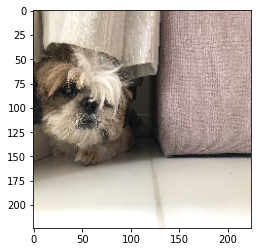

[[[[165. 150. 127.]
   [160. 145. 124.]
   [153. 138. 117.]
   ...
   [180. 151. 145.]
   [203. 176. 167.]
   [194. 165. 157.]]

  [[167. 152. 131.]
   [160. 145. 124.]
   [152. 137. 116.]
   ...
   [191. 164. 155.]
   [217. 190. 181.]
   [200. 171. 163.]]

  [[164. 149. 128.]
   [158. 143. 122.]
   [151. 136. 115.]
   ...
   [205. 178. 169.]
   [202. 178. 168.]
   [205. 180. 173.]]

  ...

  [[255. 255. 255.]
   [255. 255. 255.]
   [255. 255. 255.]
   ...
   [255. 255. 255.]
   [255. 255. 253.]
   [255. 255. 253.]]

  [[255. 255. 255.]
   [255. 255. 255.]
   [255. 255. 255.]
   ...
   [255. 255. 255.]
   [255. 255. 253.]
   [255. 255. 253.]]

  [[255. 255. 255.]
   [255. 255. 255.]
   [255. 255. 255.]
   ...
   [255. 255. 253.]
   [255. 255. 253.]
   [255. 255. 253.]]]]
--- PREDICAO COM RESNET MODELO ---
-> Primeira classe predita: Shih-Tzu (99.59%)
-> Segunda classe predita: Pekinese (0.32%)
-> Terceira classe predita: Brabancon_griffon (0.00%)


In [47]:

#def PredicaoResnet(pathImg):
#pathImg = r"C:\Users\Utilisateur\Downloads\tmp\MBA\CACHORRO\IMG_8339.JPG"
#pathImg = r"C:\Users\Utilisateur\Downloads\tmp\MBA\aranha-1.jpg"
#pathImg = r"C:\Users\Utilisateur\Downloads\tmp\MBA\montanha-parque-casa-arvore-1.jpg"
#pathImg = r"C:\Users\Utilisateur\Downloads\tmp\MBA\montanha-flor-sol-1.jpg"
pathImg = r"C:\Users\Utilisateur\Downloads\tmp\MBA\cachorro-5.JPG"
# load an image from file com o shape esperado pelo modelo ResNet (224x224)
img = image.load_img(pathImg, target_size=(224, 224))
#img = image.load_img(pathImg)
#Visualizacao da imagem
plt.imshow(img)
plt.show()
plt.pause(1) 
# convert the image pixels to a numpy array
img = image.img_to_array(img)
# reshape data for the model
img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
XImg = np.copy(img)
print(XImg)
# prepare the image for the Resnet model
img = preprocess_input_resnet(img)
# predicting images COM Resnet modelo
print("--- PREDICAO COM RESNET MODELO ---")
# predict the probability across all output classes
yhat = model_resnet.predict(img)
# convert the probabilities to class labels
label = decode_predictions_resnet(yhat)
# retrieve the FIRST most likely result, e.g. highest probability
label1 = label[0][0]
# print the classification
print('-> Primeira classe predita: %s (%.2f%%)' % (label1[1], label1[2]*100))
# retrieve the SECOND most likely result, e.g. highest probability
label2 = label[0][1]
# print the classification
print('-> Segunda classe predita: %s (%.2f%%)' % (label2[1], label2[2]*100))
# retrieve the THIRD most likely result, e.g. highest probability
label3 = label[0][3]
# print the classification
print('-> Terceira classe predita: %s (%.2f%%)' % (label3[1], label3[2]*100))

In [48]:
XImg

array([[[[165., 150., 127.],
         [160., 145., 124.],
         [153., 138., 117.],
         ...,
         [180., 151., 145.],
         [203., 176., 167.],
         [194., 165., 157.]],

        [[167., 152., 131.],
         [160., 145., 124.],
         [152., 137., 116.],
         ...,
         [191., 164., 155.],
         [217., 190., 181.],
         [200., 171., 163.]],

        [[164., 149., 128.],
         [158., 143., 122.],
         [151., 136., 115.],
         ...,
         [205., 178., 169.],
         [202., 178., 168.],
         [205., 180., 173.]],

        ...,

        [[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 253.],
         [255., 255., 253.]],

        [[255., 255., 255.],
         [255., 255., 255.],
         [255., 255., 255.],
         ...,
         [255., 255., 255.],
         [255., 255., 253.],
         [255., 255., 253.]],

        [[255., 255., 255.],
       

In [1]:
yhat = model_resnet.predict(img)
print(type(yhat))
#print(yhat)
# convert the probabilities to class labels
label = decode_predictions_resnet(yhat, 10)
print(type(label))
print(label[0][0][1])

NameError: name 'model_resnet' is not defined

In [3]:
#Lista de tags das 15 classes trabalhadas 
lstTagClas = ['arvore', 'ave', 'cachorro', 'caminhao', 'carro', 'casa', 'cavalo', \
              'gato', 'mar', 'montanha', 'ponte', 'praia', 'predio', 'rio', 'sol']
#Caso nao seja ainda feito, se ordena a lista por ordem alfabetico
lstTagClas.sort()
print(type(lstTagClas))
#Criacao do dicionario tag-id label das classes
dicTagId = {lstTagClas[idx]:idx for idx in range(len(lstTagClas))}
#Criacao do dicionario id-tag label das classes
dicIdTag = {idx:lstTagClas[idx] for idx in range(len(lstTagClas))}

<class 'list'>


In [4]:
dicTagId
dicIdTag

{0: 'arvore',
 1: 'ave',
 2: 'cachorro',
 3: 'caminhao',
 4: 'carro',
 5: 'casa',
 6: 'cavalo',
 7: 'gato',
 8: 'mar',
 9: 'montanha',
 10: 'ponte',
 11: 'praia',
 12: 'predio',
 13: 'rio',
 14: 'sol'}

In [5]:
#Criacao do dicionario dos tags das classes trabalhadas por nome de arquivo das imagens
dicTagImg = {}
#gntImages = glob.iglob("C:\\Users\\Utilisateur\\Downloads\\tmp\\MBA\\cachorro-praia-mar-*", recursive=True)
gntImages = glob.iglob("*", recursive=True)
for pth in gntImages:
    nameFile = os.path.basename(pth)
    #print(nameFile)
    #Recuperacao dos tags das classes trabalhadas do nome do arquivo
    lstTagImg = [tag for tag in nameFile.split('-') if tag in lstTagClas]
    #print(lstTagImg)
    dicTagImg[nameFile] = lstTagImg

In [12]:
#Carregamento do jogo de entrada X (pixels das imagens) e de saida (one-hot encoding dos labels das imagens)

# Funcao para ter os tags de uma imagem a parte do nome do seu arquivo e da lista das classes trabalhadas
def getTagImg(nameFile, lstTagClas):
    #Recuperacao dos tags das classes trabalhadas do nome do arquivo
    lstTagImg = [tag for tag in nameFile.split('-') if tag in lstTagClas]
    #print(lstTagImg)
    return lstTagImg

# Funcao de codificaca do jogo de saida
def oneHotEncode(lstTagImg, dicTagId):
    '''Retorna um array de binary com 1 (classe presente) ou 0 (classe nao presente) para cada classe trabalhada, 
    na posicao definida pelo ID da classe'''
    #Criacao do array de tamanho do dicionario de mapping tag-id, inicializado a 0
    npIdImg = np.zeros(len(dicTagId), dtype=int)
    #Loop sobre a lista dos diferentes tags da imagem
    for tag in lstTagImg:
        #Se posiciona 1 na posicao do arry que corresponde ao ID do tag
        npIdImg[dicTagId[tag]] = 1
    #Se retorna o array de codificacao do jogo de saida da imagem
    return npIdImg

# Criacao das listas com as imagens e com os labels
lstImgs224 = []
lstImgs299 = []
lstTgts = []
lstNameFiles = []
gntImages = glob.iglob("*sol*", recursive=True)
#OBS: Pensar a regegar o generator que ficou vazio depois do loop que gerou o dico dos tags por imagem
for pth in gntImages:
    #Se tratar-se bem de um arquivo
    if os.path.isfile(pth):
        try:
            nameFile = os.path.basename(pth)
            #print(nameFile)
            #Visualizacao da imagem sem transformacao
            #img = load_img(fr'{pth}')
            #plt.imshow(img)
            #plt.show()
            #plt.pause(1) 
            #Dados dos pixels desta imagem de tamanho ajustado para o modelo Resnet, VGG e MobileNet
            img224 = image.load_img(fr'{pth}', target_size=(224,224))
            #Dados dos pixels desta imagem de tamanho ajustado para o modelo Inception
            img299 = image.load_img(fr'{pth}', target_size=(299,299))
            # convert to numpy array
            img224 = image.img_to_array(img224)
            #print(img224)
            img299 = image.img_to_array(img299)
            #Target desta imagem
            lstTagImg = getTagImg(nameFile, lstTagClas)
            tgt = oneHotEncode(lstTagImg, dicTagId)
            #print(tgt)
            #Adicao da imagem e da target as listas
            lstImgs224.append(img224)
            lstImgs299.append(img299)
            lstTgts.append(tgt)
            lstNameFiles.append(nameFile)
        except:
            print(nameFile)
            print("Unexpected error:", sys.exc_info()[0])
    
#Se passa as imagens e as targets em array numpy X224, X299, e Y
X224 = np.asarray(lstImgs224)
X299 = np.asarray(lstImgs299)
Y = np.asarray(lstTgts, dtype=np.int8)
npNameFiles = np.asarray(lstNameFiles)

#Se salva os 2 arrays em um arquivo compressado
np.savez_compressed('XY_TestTransferLearning.npz', X224, X299, Y, npNameFiles)    
    

In [13]:
#Se recarrega o jogo de entrada e saida a parte do arquivo de compressao
data = np.load('XY_TestTransferLearning.npz')
X224, X299, Y, npNameFiles = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']
print(f'Loaded: X224: {X224.shape}, X299: {X299.shape}, Y: {Y.shape}, npNameFiles: {npNameFiles.shape}')

Loaded: X224: (115, 224, 224, 3), X299: (115, 299, 299, 3), Y: (115, 15), npNameFiles: (115,)


In [14]:
#Criacao dos diferentes objetos de predicao pre-treinada
modelVgg = VGG16()                  #VGG
modelInception = InceptionV3()      #INCEPTION
modelResnet = ResNet50()            #RESNET
modelMobilenet = MobileNetV2()      #MOBILNET

In [15]:
dicTagPred = {} #dico por tipo modelo pretreinado das predicoes do conjunto de fotos avaliadas

def PredicaoModel(model, nameMod, fctPrepMod, fctDecodPredMod, X):
    
    # Prepara a imagem com a funcao de preparacao do modelo
    XPrep = fctPrepMod(X)
    #print(XPrep)
    # Predicao com o modelo dentro de todas as classes possiveis de Imagenet
    print(f"\n--- PREDICAO COM O MODELO {nameMod} ---")
    YPred = model.predict(XPrep)
    # Converte a probabilidade para as 5 melhores classes
    tagPred = fctDecodPredMod(YPred)
    #print(tagPred[0])
    #Retorno da predicao de cada foto com este modelo
    return tagPred

#Predicao com o modelo VGG
dicTagPred['VGG'] = PredicaoModel(modelVgg, 'VGG', preprocess_input_vgg, decode_predictions_vgg, copy.deepcopy(X224))
#Predicao com o modelo Inception
dicTagPred['INCEPTION'] = PredicaoModel(modelInception, 'INCEPTION', preprocess_input_inception, decode_predictions_inception, copy.deepcopy(X299))
#Predicao com o modelo Resnet
dicTagPred['RESNET'] = PredicaoModel(modelResnet, 'RESNET', preprocess_input_resnet, decode_predictions_resnet, copy.deepcopy(X224))
#Predicao com o modelo Mobilenet
dicTagPred['MOBILENET'] = PredicaoModel(modelMobilenet, 'MOBILENET', preprocess_input_mobilenet, decode_predictions_mobilenet, copy.deepcopy(X224))

#XPrep = preprocess_input_resnet(X224)
#print(XPrep)
#YPred = modelResnet.predict(XPrep)
#tagPred = decode_predictions_resnet(YPred)    
#print(tagPred[0])





--- PREDICAO COM O MODELO VGG ---

--- PREDICAO COM O MODELO INCEPTION ---

--- PREDICAO COM O MODELO RESNET ---

--- PREDICAO COM O MODELO MOBILENET ---



============ Index 0: arvore-praia-mar-sol-1.jpg ================


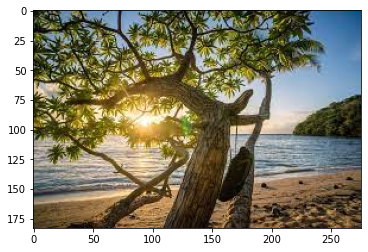

Tags da imagem: ['arvore', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n09332890', 'lakeside', 0.60777), ('n09428293', 'seashore', 0.18949592), ('n09421951', 'sandbar', 0.06805199), ('n02894605', 'breakwater', 0.038054626), ('n02859443', 'boathouse', 0.016372992)]
Predicoes modelo INCEPTION:
 [('n09332890', 'lakeside', 0.9156582), ('n09421951', 'sandbar', 0.040441863), ('n09428293', 'seashore', 0.03348843), ('n03891251', 'park_bench', 0.0010278313), ('n02859443', 'boathouse', 0.0007506459)]
Predicoes modelo RESNET:
 [('n09332890', 'lakeside', 0.94097733), ('n09428293', 'seashore', 0.04799055), ('n02859443', 'boathouse', 0.0058088703), ('n09421951', 'sandbar', 0.0010401777), ('n09468604', 'valley', 0.00047063132)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.7758772), ('n02859443', 'boathouse', 0.034634624), ('n09428293', 'seashore', 0.031018484), ('n04604644', 'worm_fence', 0.018831963), ('n04606251', 'wreck', 0.016369998)]

============ Index 1: arvore-praia-mar-sol-

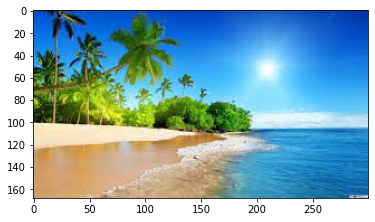

Tags da imagem: ['arvore', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.35853904), ('n09332890', 'lakeside', 0.26108113), ('n09421951', 'sandbar', 0.17395368), ('n03388043', 'fountain', 0.047419928), ('n02894605', 'breakwater', 0.028799957)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.8406671), ('n09421951', 'sandbar', 0.09017756), ('n09332890', 'lakeside', 0.020799914), ('n09399592', 'promontory', 0.0047761644), ('n09256479', 'coral_reef', 0.0040470543)]
Predicoes modelo RESNET:
 [('n09332890', 'lakeside', 0.3064925), ('n09421951', 'sandbar', 0.26123253), ('n09428293', 'seashore', 0.2602436), ('n09288635', 'geyser', 0.09319952), ('n03388043', 'fountain', 0.041574057)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.48932037), ('n09428293', 'seashore', 0.26760736), ('n09421951', 'sandbar', 0.06482908), ('n02894605', 'breakwater', 0.03168125), ('n03388043', 'fountain', 0.012424832)]

============ Index 2: arvore-rio-sol-1.jpg =======

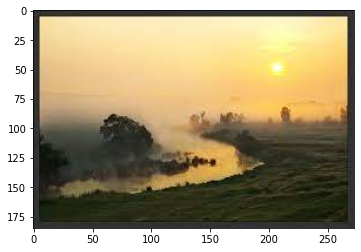

Tags da imagem: ['arvore', 'rio', 'sol']
Predicoes modelo VGG:
 [('n09288635', 'geyser', 0.3839156), ('n04404412', 'television', 0.11047315), ('n02814860', 'beacon', 0.081663445), ('n03028079', 'church', 0.042695973), ('n03782006', 'monitor', 0.041893724)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.7912875), ('n02814860', 'beacon', 0.03505314), ('n09246464', 'cliff', 0.02341627), ('n09332890', 'lakeside', 0.012527312), ('n09472597', 'volcano', 0.01090097)]
Predicoes modelo RESNET:
 [('n04404412', 'television', 0.41082823), ('n03782006', 'monitor', 0.16829641), ('n04589890', 'window_screen', 0.12807322), ('n07248320', 'book_jacket', 0.04263112), ('n04152593', 'screen', 0.02982212)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.22000062), ('n09332890', 'lakeside', 0.12573068), ('n09288635', 'geyser', 0.096579015), ('n02814860', 'beacon', 0.05483123), ('n02687172', 'aircraft_carrier', 0.03462702)]

============ Index 3: arvore-rio-sol-2.jpg ================


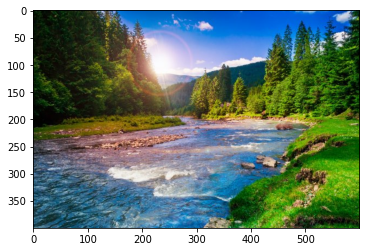

Tags da imagem: ['arvore', 'rio', 'sol']
Predicoes modelo VGG:
 [('n09468604', 'valley', 0.9029872), ('n09332890', 'lakeside', 0.057172302), ('n09193705', 'alp', 0.018416317), ('n09288635', 'geyser', 0.009655448), ('n02980441', 'castle', 0.0018501792)]
Predicoes modelo INCEPTION:
 [('n09468604', 'valley', 0.9423183), ('n09332890', 'lakeside', 0.0071127503), ('n09428293', 'seashore', 0.00552716), ('n09288635', 'geyser', 0.0033773803), ('n09193705', 'alp', 0.0023357281)]
Predicoes modelo RESNET:
 [('n09468604', 'valley', 0.9459221), ('n09332890', 'lakeside', 0.02690326), ('n09288635', 'geyser', 0.01300525), ('n03388043', 'fountain', 0.007442584), ('n09246464', 'cliff', 0.0022001076)]
Predicoes modelo MOBILENET:
 [('n09468604', 'valley', 0.69184196), ('n09332890', 'lakeside', 0.06453755), ('n02980441', 'castle', 0.04205538), ('n09288635', 'geyser', 0.013856481), ('n03388043', 'fountain', 0.011601689)]

============ Index 4: arvore-rio-sol-3.jpg ================


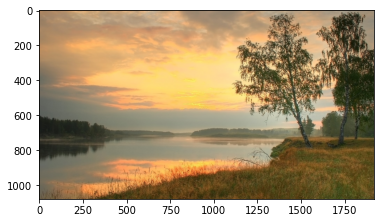

Tags da imagem: ['arvore', 'rio', 'sol']
Predicoes modelo VGG:
 [('n09332890', 'lakeside', 0.8581451), ('n02859443', 'boathouse', 0.042560518), ('n02894605', 'breakwater', 0.016093995), ('n02980441', 'castle', 0.007562372), ('n04326547', 'stone_wall', 0.0057154833)]
Predicoes modelo INCEPTION:
 [('n09332890', 'lakeside', 0.8518306), ('n09428293', 'seashore', 0.030651383), ('n09421951', 'sandbar', 0.016266737), ('n11879895', 'rapeseed', 0.012261647), ('n09468604', 'valley', 0.006008425)]
Predicoes modelo RESNET:
 [('n09332890', 'lakeside', 0.9827602), ('n02951358', 'canoe', 0.005205878), ('n09428293', 'seashore', 0.0037997805), ('n02894605', 'breakwater', 0.0024591952), ('n09468604', 'valley', 0.0016062055)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.95433146), ('n09428293', 'seashore', 0.021897571), ('n09468604', 'valley', 0.005365448), ('n09421951', 'sandbar', 0.0019862081), ('n09399592', 'promontory', 0.0018282256)]

============ Index 5: arvore-rio-sol-4.jpg =========

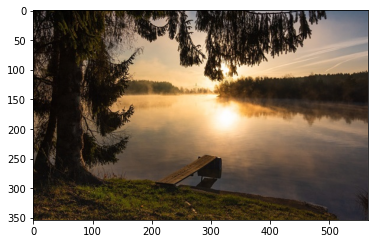

Tags da imagem: ['arvore', 'rio', 'sol']
Predicoes modelo VGG:
 [('n09332890', 'lakeside', 0.394822), ('n09288635', 'geyser', 0.07650894), ('n02859443', 'boathouse', 0.075114034), ('n09246464', 'cliff', 0.055079736), ('n03160309', 'dam', 0.054744735)]
Predicoes modelo INCEPTION:
 [('n09332890', 'lakeside', 0.48093623), ('n02951358', 'canoe', 0.3816431), ('n02859443', 'boathouse', 0.024784137), ('n03873416', 'paddle', 0.016568376), ('n03891251', 'park_bench', 0.008104665)]
Predicoes modelo RESNET:
 [('n02951358', 'canoe', 0.44274476), ('n09332890', 'lakeside', 0.2715092), ('n03891251', 'park_bench', 0.113372326), ('n02859443', 'boathouse', 0.07491731), ('n03028079', 'church', 0.037429817)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.32737324), ('n03160309', 'dam', 0.19640483), ('n02859443', 'boathouse', 0.11005966), ('n03891251', 'park_bench', 0.044014644), ('n02797295', 'barrow', 0.039293293)]

============ Index 6: arvore-rio-sol-5.jpg ================


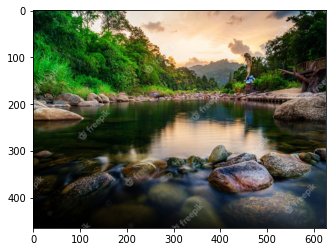

Tags da imagem: ['arvore', 'rio', 'sol']
Predicoes modelo VGG:
 [('n09468604', 'valley', 0.7277631), ('n02980441', 'castle', 0.07460037), ('n09332890', 'lakeside', 0.067180395), ('n09428293', 'seashore', 0.022648714), ('n09246464', 'cliff', 0.019658845)]
Predicoes modelo INCEPTION:
 [('n09468604', 'valley', 0.8277858), ('n09332890', 'lakeside', 0.038693856), ('n03160309', 'dam', 0.013746836), ('n01697457', 'African_crocodile', 0.009684462), ('n02980441', 'castle', 0.009348709)]
Predicoes modelo RESNET:
 [('n09468604', 'valley', 0.6433213), ('n02859443', 'boathouse', 0.14490508), ('n09332890', 'lakeside', 0.06270086), ('n01697457', 'African_crocodile', 0.024572589), ('n02980441', 'castle', 0.024432197)]
Predicoes modelo MOBILENET:
 [('n09468604', 'valley', 0.5347184), ('n03160309', 'dam', 0.1285133), ('n09332890', 'lakeside', 0.05418029), ('n01697457', 'African_crocodile', 0.02497372), ('n02859443', 'boathouse', 0.021089308)]

============ Index 7: arvore-sol-1.jpg ================


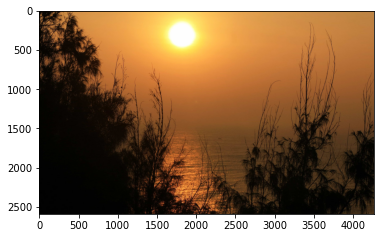

Tags da imagem: ['arvore', 'sol']
Predicoes modelo VGG:
 [('n03388043', 'fountain', 0.59998524), ('n04371774', 'swing', 0.057270076), ('n04286575', 'spotlight', 0.04595883), ('n09332890', 'lakeside', 0.0416161), ('n09288635', 'geyser', 0.024472754)]
Predicoes modelo INCEPTION:
 [('n09332890', 'lakeside', 0.3976628), ('n09428293', 'seashore', 0.14207935), ('n09246464', 'cliff', 0.094000384), ('n09468604', 'valley', 0.082833536), ('n09193705', 'alp', 0.04140573)]
Predicoes modelo RESNET:
 [('n04371774', 'swing', 0.6282364), ('n03126707', 'crane', 0.10516401), ('n03976657', 'pole', 0.0758451), ('n02782093', 'balloon', 0.04629571), ('n03388043', 'fountain', 0.044517606)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.33699262), ('n09246464', 'cliff', 0.07579073), ('n09428293', 'seashore', 0.046514716), ('n04366367', 'suspension_bridge', 0.044627048), ('n09472597', 'volcano', 0.02235945)]

============ Index 8: arvore-sol-2.jpg ================


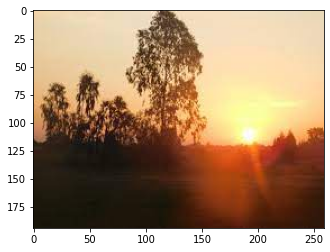

Tags da imagem: ['arvore', 'sol']
Predicoes modelo VGG:
 [('n09332890', 'lakeside', 0.38420922), ('n02782093', 'balloon', 0.0464709), ('n03837869', 'obelisk', 0.040591843), ('n02859443', 'boathouse', 0.03653661), ('n03216828', 'dock', 0.033631172)]
Predicoes modelo INCEPTION:
 [('n09332890', 'lakeside', 0.4427701), ('n02782093', 'balloon', 0.045017865), ('n09472597', 'volcano', 0.03222149), ('n09428293', 'seashore', 0.030261407), ('n03240683', 'drilling_platform', 0.020737614)]
Predicoes modelo RESNET:
 [('n02782093', 'balloon', 0.49540612), ('n09332890', 'lakeside', 0.17725456), ('n09428293', 'seashore', 0.025115982), ('n03347037', 'fire_screen', 0.018781835), ('n04589890', 'window_screen', 0.017445838)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.30051267), ('n09428293', 'seashore', 0.25081384), ('n09246464', 'cliff', 0.11233279), ('n09472597', 'volcano', 0.097781494), ('n09399592', 'promontory', 0.030706491)]

============ Index 9: arvore-sol-3.jpg ================


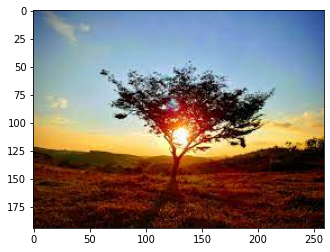

Tags da imagem: ['arvore', 'sol']
Predicoes modelo VGG:
 [('n03792972', 'mountain_tent', 0.10527746), ('n09332890', 'lakeside', 0.089497484), ('n02793495', 'barn', 0.08658459), ('n03028079', 'church', 0.065578654), ('n02814860', 'beacon', 0.04321417)]
Predicoes modelo INCEPTION:
 [('n02782093', 'balloon', 0.7871571), ('n03888257', 'parachute', 0.007104081), ('n09332890', 'lakeside', 0.004704554), ('n03991062', 'pot', 0.003815125), ('n09468604', 'valley', 0.003449054)]
Predicoes modelo RESNET:
 [('n02782093', 'balloon', 0.32403165), ('n03888257', 'parachute', 0.16341482), ('n09332890', 'lakeside', 0.10679501), ('n02814860', 'beacon', 0.045914352), ('n04044716', 'radio_telescope', 0.04224213)]
Predicoes modelo MOBILENET:
 [('n09472597', 'volcano', 0.093599096), ('n09428293', 'seashore', 0.09143344), ('n02793495', 'barn', 0.06051727), ('n09332890', 'lakeside', 0.034703527), ('n02782093', 'balloon', 0.033690885)]

============ Index 10: arvore-sol-4.jpg ================


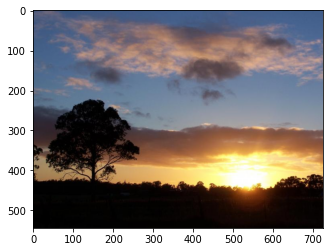

Tags da imagem: ['arvore', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.17247982), ('n09332890', 'lakeside', 0.08561021), ('n07802026', 'hay', 0.062477496), ('n02793495', 'barn', 0.058489565), ('n04044716', 'radio_telescope', 0.053645335)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.42135188), ('n09332890', 'lakeside', 0.12864369), ('n02782093', 'balloon', 0.03918508), ('n02814860', 'beacon', 0.03143839), ('n02793495', 'barn', 0.02706957)]
Predicoes modelo RESNET:
 [('n02793495', 'barn', 0.1562285), ('n09428293', 'seashore', 0.1562139), ('n03930313', 'picket_fence', 0.091795154), ('n09332890', 'lakeside', 0.050811324), ('n09472597', 'volcano', 0.042275548)]
Predicoes modelo MOBILENET:
 [('n09472597', 'volcano', 0.22081816), ('n09428293', 'seashore', 0.08644403), ('n03028079', 'church', 0.052507114), ('n02793495', 'barn', 0.04100364), ('n02782093', 'balloon', 0.03226394)]

============ Index 11: arvore-sol-5.jpg ================


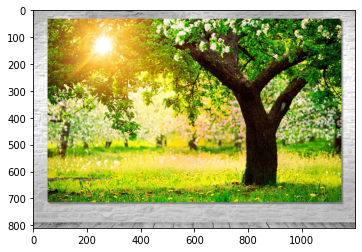

Tags da imagem: ['arvore', 'sol']
Predicoes modelo VGG:
 [('n03930313', 'picket_fence', 0.25160956), ('n03891251', 'park_bench', 0.1589267), ('n04589890', 'window_screen', 0.08528689), ('n02793495', 'barn', 0.07244348), ('n03837869', 'obelisk', 0.05284538)]
Predicoes modelo INCEPTION:
 [('n03891251', 'park_bench', 0.23426382), ('n11879895', 'rapeseed', 0.14201185), ('n02793495', 'barn', 0.11652514), ('n03930313', 'picket_fence', 0.050795276), ('n04604644', 'worm_fence', 0.04712212)]
Predicoes modelo RESNET:
 [('n11879895', 'rapeseed', 0.47914794), ('n03891251', 'park_bench', 0.17008157), ('n04152593', 'screen', 0.060618717), ('n06359193', 'web_site', 0.05131032), ('n04404412', 'television', 0.03340737)]
Predicoes modelo MOBILENET:
 [('n03891251', 'park_bench', 0.18847191), ('n03930313', 'picket_fence', 0.1016674), ('n02793495', 'barn', 0.091976814), ('n03733281', 'maze', 0.088848524), ('n04326547', 'stone_wall', 0.036505826)]

============ Index 12: arvore-sol-6.jpg ================


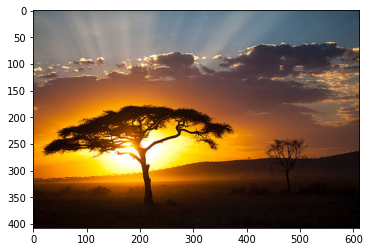

Tags da imagem: ['arvore', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.24834381), ('n09332890', 'lakeside', 0.18397881), ('n03388043', 'fountain', 0.106708005), ('n09472597', 'volcano', 0.082728356), ('n02814860', 'beacon', 0.037680134)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.44295835), ('n09472597', 'volcano', 0.4359591), ('n09332890', 'lakeside', 0.03688995), ('n09468604', 'valley', 0.0038534044), ('n09246464', 'cliff', 0.003567057)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.8139824), ('n02782093', 'balloon', 0.046361033), ('n09332890', 'lakeside', 0.043770973), ('n03388043', 'fountain', 0.01715486), ('n09472597', 'volcano', 0.0076022586)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.9527557), ('n09332890', 'lakeside', 0.012218123), ('n03976657', 'pole', 0.0033590002), ('n09468604', 'valley', 0.0026676706), ('n09193705', 'alp', 0.0023954501)]

============ Index 13: arvore-sol-9.jpg ================


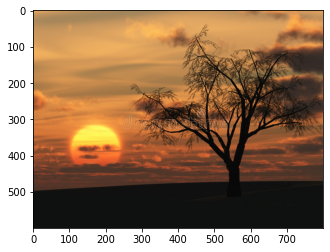

Tags da imagem: ['arvore', 'sol']
Predicoes modelo VGG:
 [('n02965783', 'car_mirror', 0.1470512), ('n09428293', 'seashore', 0.12831208), ('n09332890', 'lakeside', 0.08023935), ('n09229709', 'bubble', 0.04773457), ('n02782093', 'balloon', 0.032424066)]
Predicoes modelo INCEPTION:
 [('n02782093', 'balloon', 0.17168382), ('n02965783', 'car_mirror', 0.12828356), ('n04254680', 'soccer_ball', 0.07464564), ('n03590841', "jack-o'-lantern", 0.057044905), ('n11879895', 'rapeseed', 0.04276716)]
Predicoes modelo RESNET:
 [('n02782093', 'balloon', 0.6732456), ('n02965783', 'car_mirror', 0.085796334), ('n04562935', 'water_tower', 0.06670345), ('n04254680', 'soccer_ball', 0.059438452), ('n09428293', 'seashore', 0.02031634)]
Predicoes modelo MOBILENET:
 [('n02793495', 'barn', 0.07317769), ('n03891251', 'park_bench', 0.060614184), ('n02965783', 'car_mirror', 0.050735205), ('n09428293', 'seashore', 0.04891408), ('n07802026', 'hay', 0.040011372)]

============ Index 14: arvore-sol-montanha-2.jpg ========

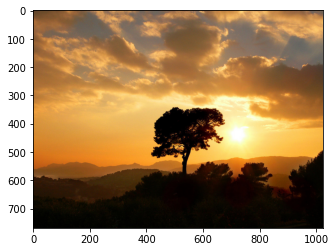

Tags da imagem: ['arvore', 'montanha', 'sol']
Predicoes modelo VGG:
 [('n02782093', 'balloon', 0.06396077), ('n09193705', 'alp', 0.059868712), ('n07802026', 'hay', 0.052644163), ('n03743016', 'megalith', 0.046882294), ('n09472597', 'volcano', 0.0462325)]
Predicoes modelo INCEPTION:
 [('n09332890', 'lakeside', 0.45740777), ('n11879895', 'rapeseed', 0.11476026), ('n09472597', 'volcano', 0.022025345), ('n09468604', 'valley', 0.019482488), ('n07802026', 'hay', 0.014165555)]
Predicoes modelo RESNET:
 [('n02782093', 'balloon', 0.45860204), ('n07802026', 'hay', 0.26235178), ('n09428293', 'seashore', 0.06564458), ('n09332890', 'lakeside', 0.027074104), ('n11879895', 'rapeseed', 0.018305546)]
Predicoes modelo MOBILENET:
 [('n09472597', 'volcano', 0.23748581), ('n09428293', 'seashore', 0.05336388), ('n02782093', 'balloon', 0.046187233), ('n02980441', 'castle', 0.037072584), ('n03388043', 'fountain', 0.036631413)]

============ Index 15: ave-sol-1.jpg ================


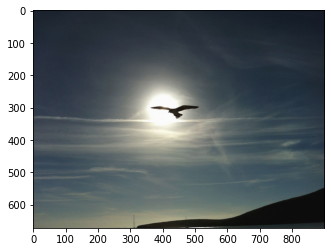

Tags da imagem: ['ave', 'sol']
Predicoes modelo VGG:
 [('n04592741', 'wing', 0.5565632), ('n03888257', 'parachute', 0.051760245), ('n09428293', 'seashore', 0.03642007), ('n02814860', 'beacon', 0.03383431), ('n04552348', 'warplane', 0.027888387)]
Predicoes modelo INCEPTION:
 [('n02690373', 'airliner', 0.71386814), ('n04592741', 'wing', 0.09557719), ('n04552348', 'warplane', 0.06880146), ('n02051845', 'pelican', 0.038768925), ('n07613480', 'trifle', 0.0035358162)]
Predicoes modelo RESNET:
 [('n09246464', 'cliff', 0.16338621), ('n04592741', 'wing', 0.13121216), ('n02814860', 'beacon', 0.10094792), ('n02051845', 'pelican', 0.09389785), ('n02058221', 'albatross', 0.07470528)]
Predicoes modelo MOBILENET:
 [('n04552348', 'warplane', 0.52084166), ('n04592741', 'wing', 0.106296435), ('n02058221', 'albatross', 0.07571982), ('n09428293', 'seashore', 0.046286967), ('n03888257', 'parachute', 0.033693727)]

============ Index 16: cachorro-mar-sol-1.jpg ================


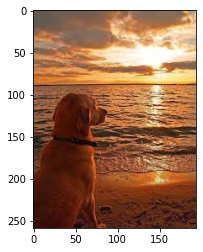

Tags da imagem: ['cachorro', 'mar', 'sol']
Predicoes modelo VGG:
 [('n02099601', 'golden_retriever', 0.26770046), ('n02100877', 'Irish_setter', 0.21746466), ('n02099849', 'Chesapeake_Bay_retriever', 0.21306701), ('n02100583', 'vizsla', 0.10594865), ('n02090379', 'redbone', 0.09328977)]
Predicoes modelo INCEPTION:
 [('n02099849', 'Chesapeake_Bay_retriever', 0.36785567), ('n02099712', 'Labrador_retriever', 0.16237311), ('n02100583', 'vizsla', 0.15706854), ('n02090379', 'redbone', 0.135633), ('n02099601', 'golden_retriever', 0.017085364)]
Predicoes modelo RESNET:
 [('n02100583', 'vizsla', 0.7366967), ('n02090379', 'redbone', 0.19443822), ('n02100877', 'Irish_setter', 0.028030591), ('n02099849', 'Chesapeake_Bay_retriever', 0.020263575), ('n02099601', 'golden_retriever', 0.013199397)]
Predicoes modelo MOBILENET:
 [('n02100583', 'vizsla', 0.6273562), ('n02090379', 'redbone', 0.26552305), ('n02099849', 'Chesapeake_Bay_retriever', 0.07174242), ('n02100877', 'Irish_setter', 0.008651428), ('n020

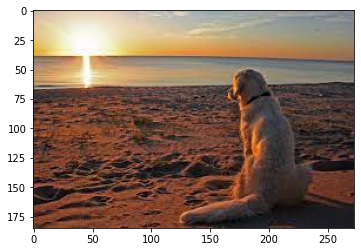

Tags da imagem: ['cachorro', 'mar', 'sol']
Predicoes modelo VGG:
 [('n02096051', 'Airedale', 0.56698227), ('n09428293', 'seashore', 0.051245224), ('n02095570', 'Lakeland_terrier', 0.040152777), ('n02093754', 'Border_terrier', 0.03922163), ('n02093991', 'Irish_terrier', 0.03372749)]
Predicoes modelo INCEPTION:
 [('n02111500', 'Great_Pyrenees', 0.19437481), ('n02099601', 'golden_retriever', 0.18154834), ('n02104029', 'kuvasz', 0.09695047), ('n02105641', 'Old_English_sheepdog', 0.05090969), ('n02134084', 'ice_bear', 0.046683066)]
Predicoes modelo RESNET:
 [('n02090379', 'redbone', 0.24972112), ('n02096051', 'Airedale', 0.1426319), ('n02092339', 'Weimaraner', 0.04554261), ('n02088238', 'basset', 0.045061372), ('n02100735', 'English_setter', 0.042326644)]
Predicoes modelo MOBILENET:
 [('n02138441', 'meerkat', 0.088772036), ('n02090379', 'redbone', 0.059913754), ('n02641379', 'gar', 0.03438868), ('n02101006', 'Gordon_setter', 0.03265045), ('n02077923', 'sea_lion', 0.029792031)]

============

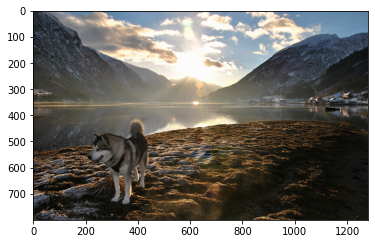

Tags da imagem: ['cachorro', 'montanha', 'rio', 'sol']
Predicoes modelo VGG:
 [('n09288635', 'geyser', 0.4689758), ('n09468604', 'valley', 0.28805932), ('n03388043', 'fountain', 0.055666577), ('n09428293', 'seashore', 0.022895902), ('n09193705', 'alp', 0.02171386)]
Predicoes modelo INCEPTION:
 [('n02110063', 'malamute', 0.6841979), ('n02110185', 'Siberian_husky', 0.1644159), ('n02109961', 'Eskimo_dog', 0.1061722), ('n03218198', 'dogsled', 0.006254575), ('n02114367', 'timber_wolf', 0.0019556046)]
Predicoes modelo RESNET:
 [('n09193705', 'alp', 0.28401905), ('n09468604', 'valley', 0.15422966), ('n02894605', 'breakwater', 0.050274443), ('n02105056', 'groenendael', 0.035020716), ('n09332890', 'lakeside', 0.03324979)]
Predicoes modelo MOBILENET:
 [('n02110063', 'malamute', 0.44360605), ('n02110185', 'Siberian_husky', 0.32747507), ('n02109961', 'Eskimo_dog', 0.21081929), ('n09332890', 'lakeside', 0.0020250205), ('n02091467', 'Norwegian_elkhound', 0.0018590848)]

============ Index 19: caminh

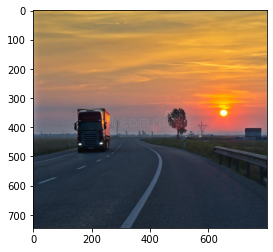

Tags da imagem: ['arvore', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.74408597), ('n02894605', 'breakwater', 0.047307245), ('n03417042', 'garbage_truck', 0.02773702), ('n06874185', 'traffic_light', 0.026751596), ('n04347754', 'submarine', 0.025301585)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.95422107), ('n03417042', 'garbage_truck', 0.010842956), ('n03796401', 'moving_van', 0.002812639), ('n04065272', 'recreational_vehicle', 0.0022631225), ('n03594945', 'jeep', 0.00180632)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.8547879), ('n04252225', 'snowplow', 0.034305014), ('n03594945', 'jeep', 0.031307865), ('n04465501', 'tractor', 0.027017059), ('n04146614', 'school_bus', 0.008728116)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.72659093), ('n03417042', 'garbage_truck', 0.056377206), ('n06874185', 'traffic_light', 0.025176203), ('n04252225', 'snowplow', 0.02133955), ('n02894605', 'breakwater', 0.020745287)]

====

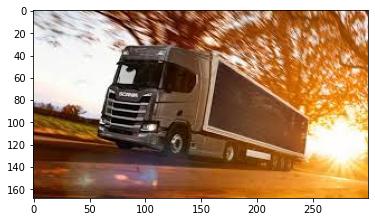

Tags da imagem: ['arvore', 'caminhao', 'sol']
Predicoes modelo VGG:
 [('n03417042', 'garbage_truck', 0.4872187), ('n04467665', 'trailer_truck', 0.21261373), ('n04252225', 'snowplow', 0.14029422), ('n03796401', 'moving_van', 0.034505926), ('n03594945', 'jeep', 0.018423986)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.8880306), ('n03796401', 'moving_van', 0.051544264), ('n04258138', 'solar_dish', 0.013602586), ('n04252225', 'snowplow', 0.007403646), ('n04044716', 'radio_telescope', 0.0013670673)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.24013595), ('n04258138', 'solar_dish', 0.22974895), ('n04065272', 'recreational_vehicle', 0.16806933), ('n04252225', 'snowplow', 0.07780164), ('n03796401', 'moving_van', 0.034414407)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.4357699), ('n03776460', 'mobile_home', 0.13458015), ('n04065272', 'recreational_vehicle', 0.11957393), ('n03796401', 'moving_van', 0.09077197), ('n03594945', 'jeep', 0.048529

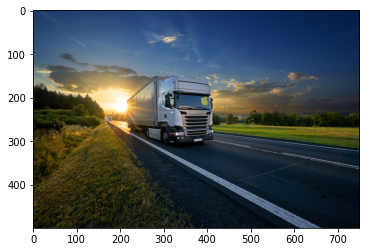

Tags da imagem: ['arvore', 'caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.8655328), ('n03895866', 'passenger_car', 0.08948368), ('n03776460', 'mobile_home', 0.0101907095), ('n03393912', 'freight_car', 0.00843841), ('n04065272', 'recreational_vehicle', 0.007741726)]
Predicoes modelo INCEPTION:
 [('n04065272', 'recreational_vehicle', 0.5808615), ('n04467665', 'trailer_truck', 0.1875541), ('n03776460', 'mobile_home', 0.07421), ('n03796401', 'moving_van', 0.051706437), ('n03895866', 'passenger_car', 0.0036321245)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.96177506), ('n04065272', 'recreational_vehicle', 0.01806628), ('n03796401', 'moving_van', 0.013906059), ('n03417042', 'garbage_truck', 0.0039986554), ('n04335435', 'streetcar', 0.00032503554)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.85708535), ('n03417042', 'garbage_truck', 0.035401955), ('n04065272', 'recreational_vehicle', 0.028894067), ('n03895866', 'passenger_car', 

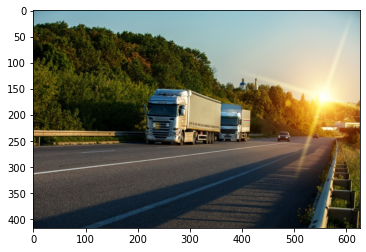

Tags da imagem: ['arvore', 'caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.90359753), ('n03393912', 'freight_car', 0.028676916), ('n03417042', 'garbage_truck', 0.023026226), ('n04252225', 'snowplow', 0.004878263), ('n03776460', 'mobile_home', 0.0046663876)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.91568154), ('n03776460', 'mobile_home', 0.026858352), ('n04065272', 'recreational_vehicle', 0.011286795), ('n03796401', 'moving_van', 0.006333707), ('n03417042', 'garbage_truck', 0.00092891837)]
Predicoes modelo RESNET:
 [('n04065272', 'recreational_vehicle', 0.5817237), ('n04467665', 'trailer_truck', 0.34274957), ('n03796401', 'moving_van', 0.036907814), ('n03417042', 'garbage_truck', 0.016130323), ('n03776460', 'mobile_home', 0.014836754)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.6913832), ('n04065272', 'recreational_vehicle', 0.11230741), ('n03796401', 'moving_van', 0.05594276), ('n03776460', 'mobile_home', 0.051066764

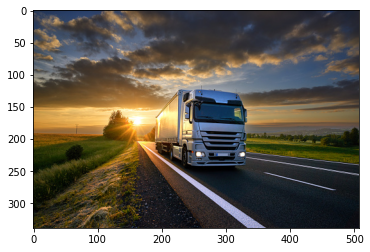

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.9912567), ('n03417042', 'garbage_truck', 0.0025678196), ('n03594945', 'jeep', 0.002120779), ('n04065272', 'recreational_vehicle', 0.0010166743), ('n03496892', 'harvester', 0.00024985938)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.83534807), ('n04065272', 'recreational_vehicle', 0.0607136), ('n03796401', 'moving_van', 0.059697352), ('n03776460', 'mobile_home', 0.0064264825), ('n04461696', 'tow_truck', 0.0011244128)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.9656223), ('n04065272', 'recreational_vehicle', 0.01949504), ('n03417042', 'garbage_truck', 0.007730004), ('n03796401', 'moving_van', 0.0030039856), ('n03594945', 'jeep', 0.0011693109)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.75096744), ('n04065272', 'recreational_vehicle', 0.12001758), ('n03417042', 'garbage_truck', 0.04355922), ('n03895866', 'passenger_car', 0.0057532587), ('n037

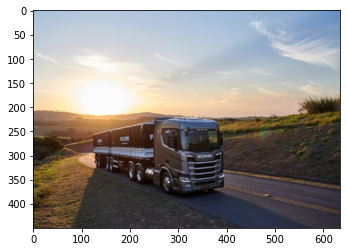

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.7559565), ('n03895866', 'passenger_car', 0.07206405), ('n04065272', 'recreational_vehicle', 0.055325236), ('n03776460', 'mobile_home', 0.020776406), ('n03393912', 'freight_car', 0.011712179)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.9657071), ('n04065272', 'recreational_vehicle', 0.009301305), ('n03796401', 'moving_van', 0.003797267), ('n04461696', 'tow_truck', 0.0020681722), ('n03776460', 'mobile_home', 0.0016064639)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.74948704), ('n04065272', 'recreational_vehicle', 0.09224824), ('n03796401', 'moving_van', 0.07367447), ('n03417042', 'garbage_truck', 0.047209617), ('n03594945', 'jeep', 0.017839275)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.63844854), ('n04065272', 'recreational_vehicle', 0.05845679), ('n03594945', 'jeep', 0.041280817), ('n04146614', 'school_bus', 0.03551343), ('n03895866', 'p

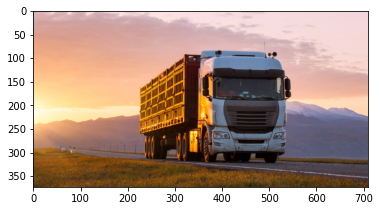

Tags da imagem: ['caminhao', 'montanha', 'sol']
Predicoes modelo VGG:
 [('n03417042', 'garbage_truck', 0.2983818), ('n04467665', 'trailer_truck', 0.23104043), ('n03594945', 'jeep', 0.19210067), ('n04065272', 'recreational_vehicle', 0.089733005), ('n03496892', 'harvester', 0.049665086)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.9705237), ('n03796401', 'moving_van', 0.005628937), ('n03393912', 'freight_car', 0.0031287966), ('n04065272', 'recreational_vehicle', 0.0020272988), ('n03776460', 'mobile_home', 0.0013433949)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.9443826), ('n03496892', 'harvester', 0.017053656), ('n03393912', 'freight_car', 0.0140224565), ('n03417042', 'garbage_truck', 0.009256874), ('n03796401', 'moving_van', 0.00346624)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.98050094), ('n03417042', 'garbage_truck', 0.0076234257), ('n03496892', 'harvester', 0.002719633), ('n04065272', 'recreational_vehicle', 0.00079304696), (

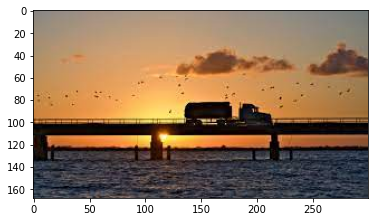

Tags da imagem: ['caminhao', 'mar', 'ponte', 'sol']
Predicoes modelo VGG:
 [('n03673027', 'liner', 0.314167), ('n03933933', 'pier', 0.15063463), ('n04347754', 'submarine', 0.10222695), ('n03095699', 'container_ship', 0.10035483), ('n03216828', 'dock', 0.089571744)]
Predicoes modelo INCEPTION:
 [('n03933933', 'pier', 0.40762645), ('n09332890', 'lakeside', 0.07386626), ('n02859443', 'boathouse', 0.04676084), ('n04467665', 'trailer_truck', 0.0254828), ('n03670208', 'limousine', 0.019949462)]
Predicoes modelo RESNET:
 [('n03933933', 'pier', 0.44743901), ('n03344393', 'fireboat', 0.2600125), ('n03240683', 'drilling_platform', 0.097344525), ('n03126707', 'crane', 0.060476318), ('n03673027', 'liner', 0.038587198)]
Predicoes modelo MOBILENET:
 [('n04347754', 'submarine', 0.3631419), ('n09428293', 'seashore', 0.10736788), ('n03095699', 'container_ship', 0.06049615), ('n03662601', 'lifeboat', 0.04225983), ('n03344393', 'fireboat', 0.032235593)]

============ Index 27: caminhao-ponte-sol-1.jpg ==

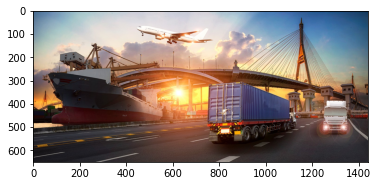

Tags da imagem: ['caminhao', 'ponte', 'sol']
Predicoes modelo VGG:
 [('n03388043', 'fountain', 0.20441315), ('n03216828', 'dock', 0.18948066), ('n03126707', 'crane', 0.12582424), ('n03344393', 'fireboat', 0.054272003), ('n04296562', 'stage', 0.04840573)]
Predicoes modelo INCEPTION:
 [('n03393912', 'freight_car', 0.30959472), ('n04467665', 'trailer_truck', 0.24174625), ('n03095699', 'container_ship', 0.06343457), ('n03796401', 'moving_van', 0.02186859), ('n03933933', 'pier', 0.017591858)]
Predicoes modelo RESNET:
 [('n03126707', 'crane', 0.350166), ('n03947888', 'pirate', 0.19647084), ('n03216828', 'dock', 0.17649819), ('n03673027', 'liner', 0.051445864), ('n04467665', 'trailer_truck', 0.04748704)]
Predicoes modelo MOBILENET:
 [('n03126707', 'crane', 0.28442988), ('n04467665', 'trailer_truck', 0.079931505), ('n03345487', 'fire_engine', 0.03982169), ('n02687172', 'aircraft_carrier', 0.036071647), ('n03773504', 'missile', 0.032739833)]

============ Index 28: caminhao-sol-1.jpg ==========

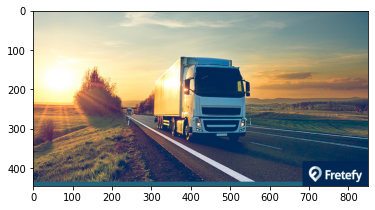

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.20684883), ('n03126707', 'crane', 0.1477184), ('n03496892', 'harvester', 0.08479641), ('n03393912', 'freight_car', 0.05530863), ('n03417042', 'garbage_truck', 0.04464163)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.81689054), ('n03796401', 'moving_van', 0.102020696), ('n03393912', 'freight_car', 0.0062900735), ('n04065272', 'recreational_vehicle', 0.0033097572), ('n03776460', 'mobile_home', 0.001507996)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.9413238), ('n03796401', 'moving_van', 0.045761164), ('n04065272', 'recreational_vehicle', 0.0072785034), ('n03417042', 'garbage_truck', 0.0012218104), ('n02701002', 'ambulance', 0.001025043)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.4458506), ('n04065272', 'recreational_vehicle', 0.14527325), ('n03895866', 'passenger_car', 0.054378614), ('n03272562', 'electric_locomotive', 0.038634013), ('n0431

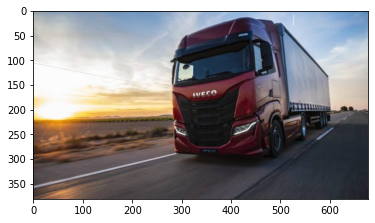

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.96482885), ('n03895866', 'passenger_car', 0.014778551), ('n04065272', 'recreational_vehicle', 0.0065851724), ('n04487081', 'trolleybus', 0.0031139248), ('n03796401', 'moving_van', 0.002411566)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.7843259), ('n03796401', 'moving_van', 0.15273914), ('n04065272', 'recreational_vehicle', 0.00329307), ('n03776460', 'mobile_home', 0.0029805645), ('n03895866', 'passenger_car', 0.0014321636)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.9393454), ('n03796401', 'moving_van', 0.03666997), ('n03895866', 'passenger_car', 0.0147766955), ('n03272562', 'electric_locomotive', 0.0014599325), ('n04461696', 'tow_truck', 0.0013836832)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.8812498), ('n04065272', 'recreational_vehicle', 0.036141817), ('n03345487', 'fire_engine', 0.007357133), ('n02701002', 'ambulance', 0.006569685)

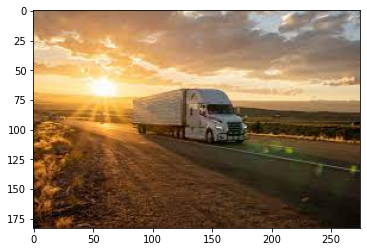

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.4273959), ('n03417042', 'garbage_truck', 0.124163955), ('n03594945', 'jeep', 0.07728287), ('n03776460', 'mobile_home', 0.042826883), ('n03895866', 'passenger_car', 0.028041592)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.9304795), ('n03796401', 'moving_van', 0.022016792), ('n03417042', 'garbage_truck', 0.0045523043), ('n03776460', 'mobile_home', 0.004224919), ('n04065272', 'recreational_vehicle', 0.0027405175)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.68585086), ('n03776460', 'mobile_home', 0.11044755), ('n04065272', 'recreational_vehicle', 0.10846615), ('n03496892', 'harvester', 0.03093777), ('n03594945', 'jeep', 0.0221517)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.9316725), ('n03796401', 'moving_van', 0.017789379), ('n03417042', 'garbage_truck', 0.010787932), ('n03594945', 'jeep', 0.008078639), ('n04065272', 'recreational_vehicle', 

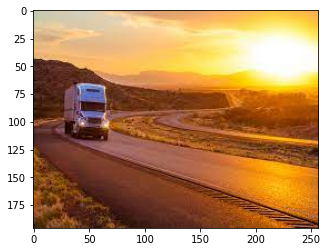

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.37678912), ('n04532670', 'viaduct', 0.08131945), ('n04146614', 'school_bus', 0.053223036), ('n03895866', 'passenger_car', 0.047655575), ('n09468604', 'valley', 0.042012002)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.46599883), ('n04065272', 'recreational_vehicle', 0.12129792), ('n02701002', 'ambulance', 0.06860745), ('n03796401', 'moving_van', 0.042844344), ('n03769881', 'minibus', 0.027440835)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.73786944), ('n03594945', 'jeep', 0.09499388), ('n02701002', 'ambulance', 0.05378991), ('n04335435', 'streetcar', 0.02409298), ('n03272562', 'electric_locomotive', 0.015020227)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.32526186), ('n09428293', 'seashore', 0.1922168), ('n02951358', 'canoe', 0.07172408), ('n04065272', 'recreational_vehicle', 0.06323678), ('n09332890', 'lakeside', 0.03276852)]

===========

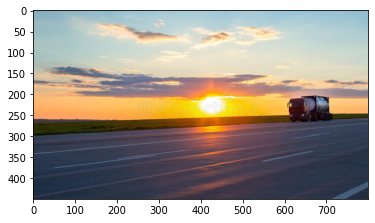

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.841468), ('n04037443', 'racer', 0.032713965), ('n06874185', 'traffic_light', 0.021840634), ('n02965783', 'car_mirror', 0.020820078), ('n03417042', 'garbage_truck', 0.008853851)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.36355162), ('n04465501', 'tractor', 0.34273922), ('n03594945', 'jeep', 0.040084973), ('n03417042', 'garbage_truck', 0.03911238), ('n04065272', 'recreational_vehicle', 0.03243237)]
Predicoes modelo RESNET:
 [('n03594945', 'jeep', 0.25525963), ('n04467665', 'trailer_truck', 0.22636457), ('n02965783', 'car_mirror', 0.17685872), ('n04252225', 'snowplow', 0.12698555), ('n03417042', 'garbage_truck', 0.10060513)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.20371771), ('n04037443', 'racer', 0.10015261), ('n09428293', 'seashore', 0.061875746), ('n02704792', 'amphibian', 0.03906187), ('n03538406', 'horse_cart', 0.03614424)]

============ Index 33: c

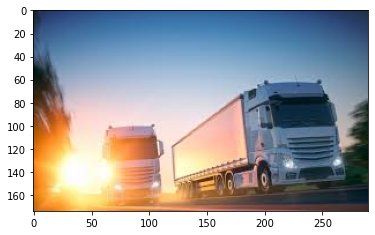

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.26881638), ('n02965783', 'car_mirror', 0.14413397), ('n03388043', 'fountain', 0.052317865), ('n03417042', 'garbage_truck', 0.04060028), ('n04065272', 'recreational_vehicle', 0.039343)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.8442347), ('n03796401', 'moving_van', 0.10173411), ('n03496892', 'harvester', 0.0056115096), ('n03417042', 'garbage_truck', 0.0037833552), ('n04065272', 'recreational_vehicle', 0.0014318255)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.31748608), ('n02701002', 'ambulance', 0.069996044), ('n03126707', 'crane', 0.06984041), ('n04065272', 'recreational_vehicle', 0.059227977), ('n03095699', 'container_ship', 0.051844046)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.21177462), ('n03126707', 'crane', 0.06377794), ('n03796401', 'moving_van', 0.039045013), ('n04258138', 'solar_dish', 0.034789626), ('n03933933', 'pier', 0.026

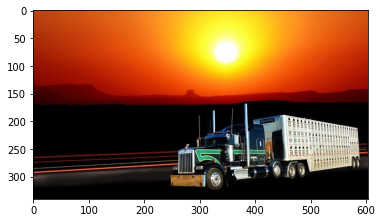

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.8924784), ('n03417042', 'garbage_truck', 0.046093725), ('n04461696', 'tow_truck', 0.01680993), ('n03796401', 'moving_van', 0.0059225853), ('n03126707', 'crane', 0.00428985)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.8801627), ('n03796401', 'moving_van', 0.017470421), ('n03417042', 'garbage_truck', 0.012302496), ('n04461696', 'tow_truck', 0.002399663), ('n01985128', 'crayfish', 0.00091865216)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.7763249), ('n03417042', 'garbage_truck', 0.20491889), ('n03126707', 'crane', 0.006947201), ('n03384352', 'forklift', 0.0049832705), ('n03796401', 'moving_van', 0.0013679328)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.9745384), ('n03417042', 'garbage_truck', 0.0034712183), ('n03796401', 'moving_van', 0.0014513615), ('n03384352', 'forklift', 0.00075041084), ('n04461696', 'tow_truck', 0.0006745722)]

========

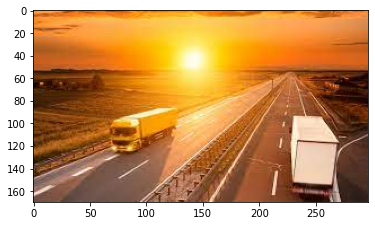

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04366367', 'suspension_bridge', 0.25638586), ('n03160309', 'dam', 0.22835356), ('n03933933', 'pier', 0.12746862), ('n04592741', 'wing', 0.061400887), ('n04467665', 'trailer_truck', 0.058559977)]
Predicoes modelo INCEPTION:
 [('n03095699', 'container_ship', 0.48400125), ('n04467665', 'trailer_truck', 0.09106929), ('n09428293', 'seashore', 0.041398168), ('n04335435', 'streetcar', 0.028029427), ('n03697007', 'lumbermill', 0.025594106)]
Predicoes modelo RESNET:
 [('n03393912', 'freight_car', 0.42511383), ('n04467665', 'trailer_truck', 0.41493237), ('n04335435', 'streetcar', 0.058339402), ('n03895866', 'passenger_car', 0.036594104), ('n03272562', 'electric_locomotive', 0.0097059645)]
Predicoes modelo MOBILENET:
 [('n03933933', 'pier', 0.12745307), ('n03895866', 'passenger_car', 0.08777776), ('n03216828', 'dock', 0.06975216), ('n03160309', 'dam', 0.058738496), ('n02917067', 'bullet_train', 0.046769623)]

============ Index 36: ca

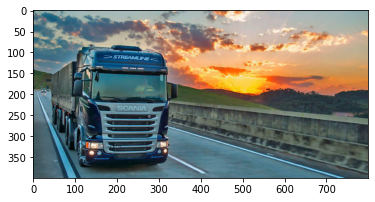

Tags da imagem: ['caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.8292535), ('n04065272', 'recreational_vehicle', 0.07659214), ('n02701002', 'ambulance', 0.024992544), ('n03417042', 'garbage_truck', 0.015966225), ('n03796401', 'moving_van', 0.011827831)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.44823584), ('n04065272', 'recreational_vehicle', 0.3623785), ('n03796401', 'moving_van', 0.041516814), ('n03776460', 'mobile_home', 0.010609513), ('n04461696', 'tow_truck', 0.0061332923)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.97522825), ('n04146614', 'school_bus', 0.012036973), ('n03796401', 'moving_van', 0.006965954), ('n03895866', 'passenger_car', 0.0016104153), ('n04335435', 'streetcar', 0.0011222446)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.93010134), ('n04465501', 'tractor', 0.0046708994), ('n04146614', 'school_bus', 0.0042660306), ('n03459775', 'grille', 0.0026513913), ('n03649909', 'lawn_mower', 

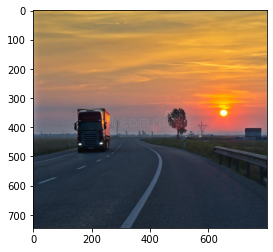

Tags da imagem: ['arvore', 'caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.74408597), ('n02894605', 'breakwater', 0.047307245), ('n03417042', 'garbage_truck', 0.02773702), ('n06874185', 'traffic_light', 0.026751596), ('n04347754', 'submarine', 0.025301585)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.95422107), ('n03417042', 'garbage_truck', 0.010842956), ('n03796401', 'moving_van', 0.002812639), ('n04065272', 'recreational_vehicle', 0.0022631225), ('n03594945', 'jeep', 0.00180632)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.8547879), ('n04252225', 'snowplow', 0.034305014), ('n03594945', 'jeep', 0.031307865), ('n04465501', 'tractor', 0.027017059), ('n04146614', 'school_bus', 0.008728116)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.72659093), ('n03417042', 'garbage_truck', 0.056377206), ('n06874185', 'traffic_light', 0.025176203), ('n04252225', 'snowplow', 0.02133955), ('n02894605', 'breakwater', 0.02074

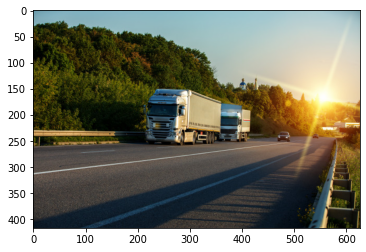

Tags da imagem: ['arvore', 'caminhao', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.90665376), ('n03393912', 'freight_car', 0.030878054), ('n03417042', 'garbage_truck', 0.021217905), ('n04252225', 'snowplow', 0.00467872), ('n03776460', 'mobile_home', 0.0041552563)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.8952137), ('n03776460', 'mobile_home', 0.036142267), ('n04065272', 'recreational_vehicle', 0.016285766), ('n03796401', 'moving_van', 0.006172896), ('n03417042', 'garbage_truck', 0.0013386821)]
Predicoes modelo RESNET:
 [('n04065272', 'recreational_vehicle', 0.5982261), ('n04467665', 'trailer_truck', 0.31568465), ('n03796401', 'moving_van', 0.037063085), ('n03417042', 'garbage_truck', 0.024272071), ('n03776460', 'mobile_home', 0.014269223)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.7481709), ('n04065272', 'recreational_vehicle', 0.07664251), ('n03796401', 'moving_van', 0.053704392), ('n03776460', 'mobile_home', 0.020738551),

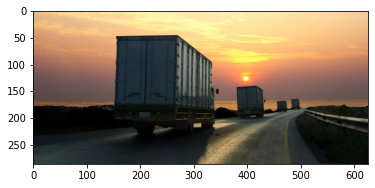

Tags da imagem: ['caminhao', 'mar', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.39681736), ('n03933933', 'pier', 0.35467198), ('n02894605', 'breakwater', 0.06832255), ('n03160309', 'dam', 0.035249513), ('n02859443', 'boathouse', 0.028581066)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.5661216), ('n03796401', 'moving_van', 0.37878242), ('n03776460', 'mobile_home', 0.009617992), ('n03393912', 'freight_car', 0.00399921), ('n03384352', 'forklift', 0.0032889373)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.56016713), ('n03933933', 'pier', 0.09074465), ('n03393912', 'freight_car', 0.046923514), ('n04562935', 'water_tower', 0.044078965), ('n02859443', 'boathouse', 0.036452387)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.9091167), ('n03393912', 'freight_car', 0.022106193), ('n03933933', 'pier', 0.008286312), ('n03796401', 'moving_van', 0.008283832), ('n02894605', 'breakwater', 0.007598106)]

============ Index 40: cami

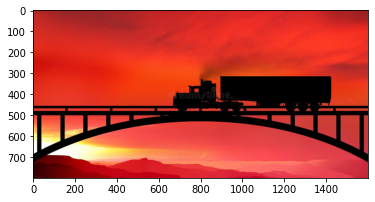

Tags da imagem: ['caminhao', 'ponte', 'sol']
Predicoes modelo VGG:
 [('n04311004', 'steel_arch_bridge', 0.21876916), ('n03874293', 'paddlewheel', 0.21430425), ('n03126707', 'crane', 0.20761138), ('n03933933', 'pier', 0.119369894), ('n03344393', 'fireboat', 0.07306865)]
Predicoes modelo INCEPTION:
 [('n04311004', 'steel_arch_bridge', 0.81012297), ('n03933933', 'pier', 0.1584915), ('n02788148', 'bannister', 0.002142298), ('n03160309', 'dam', 0.0015366212), ('n04366367', 'suspension_bridge', 0.0010125546)]
Predicoes modelo RESNET:
 [('n02788148', 'bannister', 0.47498906), ('n03933933', 'pier', 0.28315514), ('n04311004', 'steel_arch_bridge', 0.03550347), ('n02814860', 'beacon', 0.03117597), ('n04604644', 'worm_fence', 0.019105237)]
Predicoes modelo MOBILENET:
 [('n04311004', 'steel_arch_bridge', 0.7514773), ('n03933933', 'pier', 0.11729387), ('n02788148', 'bannister', 0.0065873284), ('n04532670', 'viaduct', 0.0056556), ('n04366367', 'suspension_bridge', 0.0042941403)]

============ Index 4

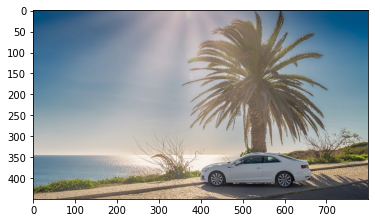

Tags da imagem: ['arvore', 'carro', 'mar', 'sol']
Predicoes modelo VGG:
 [('n03770679', 'minivan', 0.07592173), ('n09332890', 'lakeside', 0.06782659), ('n04065272', 'recreational_vehicle', 0.06696954), ('n03100240', 'convertible', 0.060858186), ('n09428293', 'seashore', 0.055852152)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.2802639), ('n04285008', 'sports_car', 0.16007982), ('n03100240', 'convertible', 0.13095716), ('n03770679', 'minivan', 0.06285425), ('n02974003', 'car_wheel', 0.032662105)]
Predicoes modelo RESNET:
 [('n03594945', 'jeep', 0.20450138), ('n03445924', 'golfcart', 0.13001837), ('n03100240', 'convertible', 0.080914766), ('n03770679', 'minivan', 0.07227611), ('n02974003', 'car_wheel', 0.058664598)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.2636455), ('n03770679', 'minivan', 0.23522851), ('n09428293', 'seashore', 0.057083283), ('n09421951', 'sandbar', 0.03393403), ('n02814860', 'beacon', 0.029893972)]

============ Index 42: carro-arvore-sol

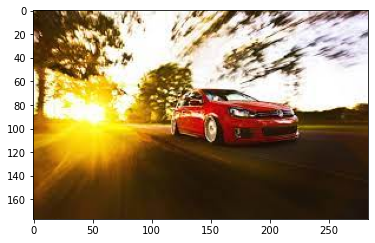

Tags da imagem: ['arvore', 'carro', 'sol']
Predicoes modelo VGG:
 [('n03345487', 'fire_engine', 0.45061693), ('n04252225', 'snowplow', 0.17284647), ('n04461696', 'tow_truck', 0.10017124), ('n02965783', 'car_mirror', 0.0368521), ('n04037443', 'racer', 0.029650575)]
Predicoes modelo INCEPTION:
 [('n04285008', 'sports_car', 0.2391311), ('n03100240', 'convertible', 0.14524819), ('n04037443', 'racer', 0.05691918), ('n03345487', 'fire_engine', 0.03631367), ('n03930630', 'pickup', 0.010416069)]
Predicoes modelo RESNET:
 [('n03345487', 'fire_engine', 0.69783425), ('n04285008', 'sports_car', 0.17937563), ('n04037443', 'racer', 0.026979947), ('n03100240', 'convertible', 0.020872718), ('n03930630', 'pickup', 0.020712122)]
Predicoes modelo MOBILENET:
 [('n03345487', 'fire_engine', 0.14329521), ('n03594945', 'jeep', 0.118739665), ('n04461696', 'tow_truck', 0.108734615), ('n04037443', 'racer', 0.0827439), ('n04252225', 'snowplow', 0.07169709)]

============ Index 43: carro-casa-sol-1.jpg ===========

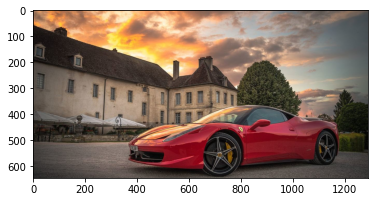

Tags da imagem: ['carro', 'casa', 'sol']
Predicoes modelo VGG:
 [('n02980441', 'castle', 0.43511716), ('n04285008', 'sports_car', 0.19588976), ('n04037443', 'racer', 0.10186866), ('n03100240', 'convertible', 0.059501972), ('n03028079', 'church', 0.054147407)]
Predicoes modelo INCEPTION:
 [('n04285008', 'sports_car', 0.7474491), ('n02974003', 'car_wheel', 0.07724347), ('n04037443', 'racer', 0.015931541), ('n03100240', 'convertible', 0.009091198), ('n03459775', 'grille', 0.0056639994)]
Predicoes modelo RESNET:
 [('n02980441', 'castle', 0.27914602), ('n04285008', 'sports_car', 0.2525034), ('n03028079', 'church', 0.2110292), ('n03781244', 'monastery', 0.057918917), ('n03459775', 'grille', 0.0442871)]
Predicoes modelo MOBILENET:
 [('n04285008', 'sports_car', 0.212789), ('n02980441', 'castle', 0.19531459), ('n02974003', 'car_wheel', 0.097098), ('n04037443', 'racer', 0.0702548), ('n03028079', 'church', 0.06396885)]

============ Index 44: carro-mar-sol-1.jpg ================


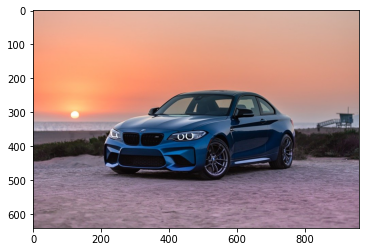

Tags da imagem: ['carro', 'mar', 'sol']
Predicoes modelo VGG:
 [('n04037443', 'racer', 0.37170926), ('n04285008', 'sports_car', 0.34712136), ('n02974003', 'car_wheel', 0.111882515), ('n03100240', 'convertible', 0.079744615), ('n02814533', 'beach_wagon', 0.022641825)]
Predicoes modelo INCEPTION:
 [('n04285008', 'sports_car', 0.46652472), ('n04037443', 'racer', 0.31770805), ('n02974003', 'car_wheel', 0.121192954), ('n03459775', 'grille', 0.025693165), ('n03100240', 'convertible', 0.0048112175)]
Predicoes modelo RESNET:
 [('n03930630', 'pickup', 0.45029265), ('n02974003', 'car_wheel', 0.20073332), ('n04037443', 'racer', 0.0735805), ('n03770679', 'minivan', 0.067141384), ('n04285008', 'sports_car', 0.06242552)]
Predicoes modelo MOBILENET:
 [('n04037443', 'racer', 0.39503902), ('n04285008', 'sports_car', 0.2862008), ('n02974003', 'car_wheel', 0.07043238), ('n03100240', 'convertible', 0.017733112), ('n02814533', 'beach_wagon', 0.015686167)]

============ Index 45: carro-mar-sol-2.jpg =======

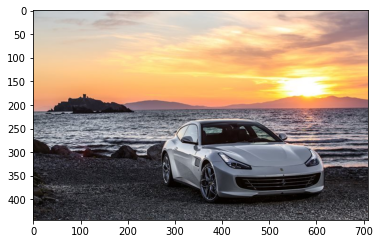

Tags da imagem: ['carro', 'mar', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.23992236), ('n03100240', 'convertible', 0.22992866), ('n09332890', 'lakeside', 0.206812), ('n02894605', 'breakwater', 0.03619209), ('n02974003', 'car_wheel', 0.035876524)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.2607129), ('n04285008', 'sports_car', 0.1324277), ('n03459775', 'grille', 0.066022284), ('n03100240', 'convertible', 0.06002155), ('n09399592', 'promontory', 0.054537054)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.6049764), ('n09399592', 'promontory', 0.1004545), ('n03770679', 'minivan', 0.08620062), ('n09332890', 'lakeside', 0.04026072), ('n03100240', 'convertible', 0.028234042)]
Predicoes modelo MOBILENET:
 [('n02974003', 'car_wheel', 0.14649355), ('n03930630', 'pickup', 0.11925759), ('n03459775', 'grille', 0.10016336), ('n04285008', 'sports_car', 0.090309575), ('n03770679', 'minivan', 0.08682941)]

============ Index 46: carro-mar-sol-3.jpg =============

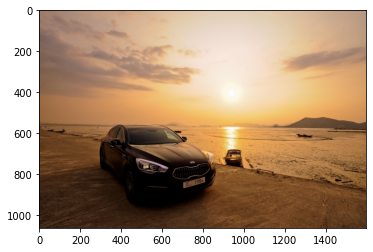

Tags da imagem: ['carro', 'mar', 'sol']
Predicoes modelo VGG:
 [('n04037443', 'racer', 0.20728043), ('n04285008', 'sports_car', 0.09789189), ('n03594945', 'jeep', 0.07322205), ('n02974003', 'car_wheel', 0.058873124), ('n09428293', 'seashore', 0.057659354)]
Predicoes modelo INCEPTION:
 [('n03594945', 'jeep', 0.688127), ('n03770679', 'minivan', 0.23072591), ('n02814533', 'beach_wagon', 0.017425807), ('n02974003', 'car_wheel', 0.012073342), ('n04285008', 'sports_car', 0.0062463633)]
Predicoes modelo RESNET:
 [('n03594945', 'jeep', 0.92432755), ('n04037443', 'racer', 0.03959763), ('n03770679', 'minivan', 0.022833971), ('n02974003', 'car_wheel', 0.005041168), ('n04285008', 'sports_car', 0.0025138324)]
Predicoes modelo MOBILENET:
 [('n04037443', 'racer', 0.2508688), ('n03594945', 'jeep', 0.1923133), ('n02974003', 'car_wheel', 0.1232463), ('n04285008', 'sports_car', 0.09152112), ('n03100240', 'convertible', 0.049081225)]

============ Index 47: carro-mar-sol-4.jpg ================


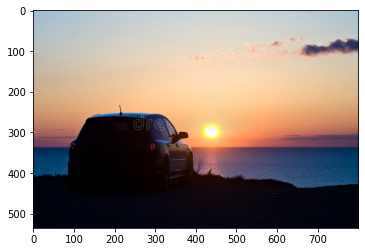

Tags da imagem: ['carro', 'mar', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.13142009), ('n03095699', 'container_ship', 0.10501652), ('n02814860', 'beacon', 0.10446215), ('n09399592', 'promontory', 0.102749385), ('n02894605', 'breakwater', 0.085274406)]
Predicoes modelo INCEPTION:
 [('n04065272', 'recreational_vehicle', 0.36358473), ('n03594945', 'jeep', 0.14026506), ('n04467665', 'trailer_truck', 0.06898944), ('n03770679', 'minivan', 0.046542283), ('n04461696', 'tow_truck', 0.03051799)]
Predicoes modelo RESNET:
 [('n03594945', 'jeep', 0.72009945), ('n03770679', 'minivan', 0.15130913), ('n09428293', 'seashore', 0.0213831), ('n09399592', 'promontory', 0.020894693), ('n04606251', 'wreck', 0.013479234)]
Predicoes modelo MOBILENET:
 [('n03594945', 'jeep', 0.29331475), ('n02704792', 'amphibian', 0.16497406), ('n03417042', 'garbage_truck', 0.08034372), ('n04252225', 'snowplow', 0.03531754), ('n03770679', 'minivan', 0.022133814)]

============ Index 48: carro-praia-mar-sol

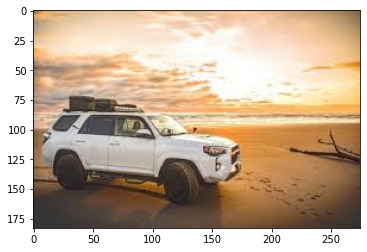

Tags da imagem: ['carro', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n03594945', 'jeep', 0.74590206), ('n04461696', 'tow_truck', 0.06092739), ('n02930766', 'cab', 0.045329023), ('n02814533', 'beach_wagon', 0.021039024), ('n04037443', 'racer', 0.018620566)]
Predicoes modelo INCEPTION:
 [('n02974003', 'car_wheel', 0.23271927), ('n09428293', 'seashore', 0.14322092), ('n02930766', 'cab', 0.094271936), ('n04285008', 'sports_car', 0.07094089), ('n04037443', 'racer', 0.033374477)]
Predicoes modelo RESNET:
 [('n03594945', 'jeep', 0.77822465), ('n03930630', 'pickup', 0.07266796), ('n04461696', 'tow_truck', 0.04748043), ('n04252225', 'snowplow', 0.026702777), ('n04037443', 'racer', 0.011601807)]
Predicoes modelo MOBILENET:
 [('n03594945', 'jeep', 0.7484638), ('n04461696', 'tow_truck', 0.047656737), ('n03930630', 'pickup', 0.034630287), ('n04252225', 'snowplow', 0.023013888), ('n02974003', 'car_wheel', 0.006762845)]

============ Index 49: carro-praia-mar-sol-2.jpg ================


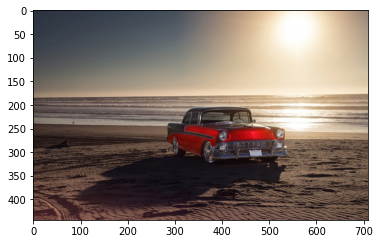

Tags da imagem: ['carro', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n03594945', 'jeep', 0.64624494), ('n04252077', 'snowmobile', 0.05036204), ('n09428293', 'seashore', 0.045236163), ('n04037443', 'racer', 0.039928313), ('n03100240', 'convertible', 0.032971833)]
Predicoes modelo INCEPTION:
 [('n03594945', 'jeep', 0.4181074), ('n03100240', 'convertible', 0.18636332), ('n03459775', 'grille', 0.16883957), ('n02814533', 'beach_wagon', 0.079021), ('n03930630', 'pickup', 0.016347092)]
Predicoes modelo RESNET:
 [('n03594945', 'jeep', 0.70906246), ('n09428293', 'seashore', 0.1523691), ('n02704792', 'amphibian', 0.054422997), ('n09421951', 'sandbar', 0.013073782), ('n03100240', 'convertible', 0.010436188)]
Predicoes modelo MOBILENET:
 [('n03594945', 'jeep', 0.5733174), ('n04465501', 'tractor', 0.046607308), ('n04252225', 'snowplow', 0.044347573), ('n03649909', 'lawn_mower', 0.04058793), ('n02704792', 'amphibian', 0.039065633)]

============ Index 50: carro-praia-mar-sol-3.jpg ============

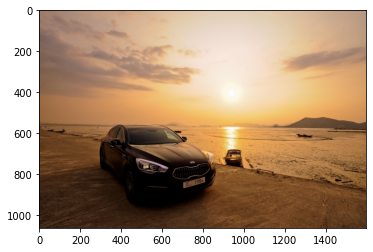

Tags da imagem: ['carro', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n04037443', 'racer', 0.20728043), ('n04285008', 'sports_car', 0.09789189), ('n03594945', 'jeep', 0.07322205), ('n02974003', 'car_wheel', 0.058873124), ('n09428293', 'seashore', 0.057659354)]
Predicoes modelo INCEPTION:
 [('n03594945', 'jeep', 0.688127), ('n03770679', 'minivan', 0.23072591), ('n02814533', 'beach_wagon', 0.017425807), ('n02974003', 'car_wheel', 0.012073342), ('n04285008', 'sports_car', 0.0062463633)]
Predicoes modelo RESNET:
 [('n03594945', 'jeep', 0.92432755), ('n04037443', 'racer', 0.03959763), ('n03770679', 'minivan', 0.022833971), ('n02974003', 'car_wheel', 0.005041168), ('n04285008', 'sports_car', 0.0025138324)]
Predicoes modelo MOBILENET:
 [('n04037443', 'racer', 0.2508688), ('n03594945', 'jeep', 0.1923133), ('n02974003', 'car_wheel', 0.1232463), ('n04285008', 'sports_car', 0.09152112), ('n03100240', 'convertible', 0.049081225)]

============ Index 51: carro-praia-mar-sol-4.jpg =============

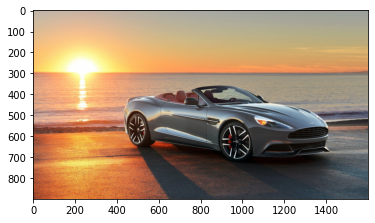

Tags da imagem: ['carro', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n04285008', 'sports_car', 0.5462546), ('n03100240', 'convertible', 0.23201564), ('n04037443', 'racer', 0.119142696), ('n02974003', 'car_wheel', 0.08128445), ('n03459775', 'grille', 0.012568774)]
Predicoes modelo INCEPTION:
 [('n04285008', 'sports_car', 0.48067492), ('n03100240', 'convertible', 0.3725692), ('n02974003', 'car_wheel', 0.006838139), ('n03459775', 'grille', 0.0037206712), ('n04037443', 'racer', 0.0014122317)]
Predicoes modelo RESNET:
 [('n04285008', 'sports_car', 0.8421932), ('n03100240', 'convertible', 0.07279596), ('n04037443', 'racer', 0.05793906), ('n02974003', 'car_wheel', 0.021531992), ('n03459775', 'grille', 0.004765753)]
Predicoes modelo MOBILENET:
 [('n04037443', 'racer', 0.3577046), ('n04285008', 'sports_car', 0.35029554), ('n03100240', 'convertible', 0.106125616), ('n02974003', 'car_wheel', 0.060380302), ('n03459775', 'grille', 0.008271431)]

============ Index 52: carro-rio-sol-1.jpg ====

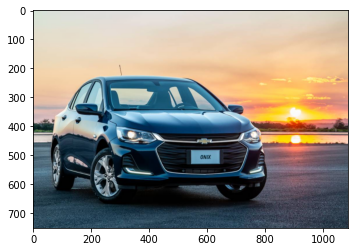

Tags da imagem: ['carro', 'rio', 'sol']
Predicoes modelo VGG:
 [('n03770679', 'minivan', 0.3670772), ('n03930630', 'pickup', 0.15342546), ('n03769881', 'minibus', 0.06459154), ('n02974003', 'car_wheel', 0.06138818), ('n02814533', 'beach_wagon', 0.057577692)]
Predicoes modelo INCEPTION:
 [('n03770679', 'minivan', 0.39195684), ('n04285008', 'sports_car', 0.19950278), ('n03459775', 'grille', 0.09620382), ('n02974003', 'car_wheel', 0.04278242), ('n02930766', 'cab', 0.019087998)]
Predicoes modelo RESNET:
 [('n03770679', 'minivan', 0.83701885), ('n03459775', 'grille', 0.049750153), ('n03930630', 'pickup', 0.04670146), ('n02974003', 'car_wheel', 0.033775285), ('n03100240', 'convertible', 0.0069432533)]
Predicoes modelo MOBILENET:
 [('n03459775', 'grille', 0.17923036), ('n03770679', 'minivan', 0.17127424), ('n02974003', 'car_wheel', 0.10564129), ('n02814533', 'beach_wagon', 0.089174844), ('n03100240', 'convertible', 0.038833417)]

============ Index 53: carro-rio-sol-2.jpg ================


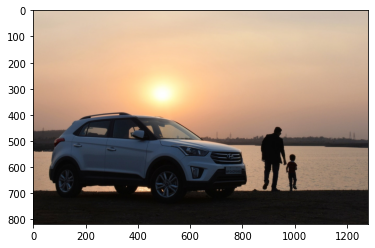

Tags da imagem: ['carro', 'rio', 'sol']
Predicoes modelo VGG:
 [('n03594945', 'jeep', 0.2800627), ('n04461696', 'tow_truck', 0.11701815), ('n03930630', 'pickup', 0.04244896), ('n02437312', 'Arabian_camel', 0.034797836), ('n03770679', 'minivan', 0.03313995)]
Predicoes modelo INCEPTION:
 [('n03930630', 'pickup', 0.4762797), ('n02974003', 'car_wheel', 0.108088225), ('n03594945', 'jeep', 0.03888142), ('n03770679', 'minivan', 0.020436455), ('n03459775', 'grille', 0.017115813)]
Predicoes modelo RESNET:
 [('n03770679', 'minivan', 0.8467716), ('n03594945', 'jeep', 0.021247959), ('n03891332', 'parking_meter', 0.009397076), ('n04485082', 'tripod', 0.009107108), ('n03792972', 'mountain_tent', 0.0071638827)]
Predicoes modelo MOBILENET:
 [('n02974003', 'car_wheel', 0.16395743), ('n03594945', 'jeep', 0.130751), ('n03770679', 'minivan', 0.12366287), ('n04461696', 'tow_truck', 0.09438928), ('n02814533', 'beach_wagon', 0.026505586)]

============ Index 54: carro-sol-1.jpeg ================


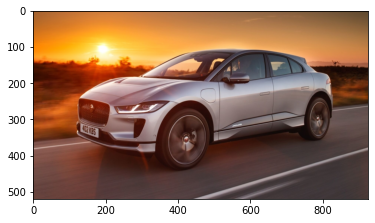

Tags da imagem: ['carro', 'sol']
Predicoes modelo VGG:
 [('n03930630', 'pickup', 0.21564145), ('n04037443', 'racer', 0.13171305), ('n02974003', 'car_wheel', 0.10721448), ('n04461696', 'tow_truck', 0.10198691), ('n03770679', 'minivan', 0.100240424)]
Predicoes modelo INCEPTION:
 [('n04285008', 'sports_car', 0.5741834), ('n02974003', 'car_wheel', 0.09308542), ('n03459775', 'grille', 0.080978125), ('n02814533', 'beach_wagon', 0.06936755), ('n03100240', 'convertible', 0.04050142)]
Predicoes modelo RESNET:
 [('n03459775', 'grille', 0.30012226), ('n04285008', 'sports_car', 0.24903847), ('n02974003', 'car_wheel', 0.24257241), ('n04037443', 'racer', 0.085473925), ('n02814533', 'beach_wagon', 0.069261745)]
Predicoes modelo MOBILENET:
 [('n02814533', 'beach_wagon', 0.36242077), ('n02974003', 'car_wheel', 0.08461323), ('n03459775', 'grille', 0.079183795), ('n04285008', 'sports_car', 0.05807576), ('n03770679', 'minivan', 0.03114239)]

============ Index 55: carro-sol-1.jpg ================


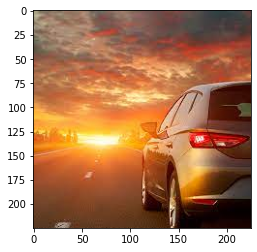

Tags da imagem: ['carro', 'sol']
Predicoes modelo VGG:
 [('n04285008', 'sports_car', 0.2537442), ('n03770679', 'minivan', 0.21085523), ('n03459775', 'grille', 0.110826425), ('n03670208', 'limousine', 0.10293978), ('n02930766', 'cab', 0.09316158)]
Predicoes modelo INCEPTION:
 [('n03770679', 'minivan', 0.3876672), ('n02974003', 'car_wheel', 0.16031088), ('n04285008', 'sports_car', 0.12497574), ('n02814533', 'beach_wagon', 0.07559032), ('n02930766', 'cab', 0.010065645)]
Predicoes modelo RESNET:
 [('n03770679', 'minivan', 0.44715157), ('n02814533', 'beach_wagon', 0.11836783), ('n02974003', 'car_wheel', 0.10309527), ('n02930766', 'cab', 0.09728505), ('n02965783', 'car_mirror', 0.06663953)]
Predicoes modelo MOBILENET:
 [('n04285008', 'sports_car', 0.5546139), ('n03100240', 'convertible', 0.035049267), ('n02930766', 'cab', 0.030241422), ('n03670208', 'limousine', 0.029408194), ('n02917067', 'bullet_train', 0.021485986)]

============ Index 56: carro-sol-2.jpeg ================


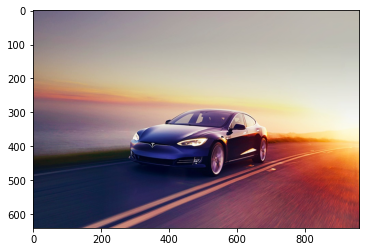

Tags da imagem: ['carro', 'sol']
Predicoes modelo VGG:
 [('n04037443', 'racer', 0.41994244), ('n04467665', 'trailer_truck', 0.21672806), ('n04461696', 'tow_truck', 0.07830887), ('n04285008', 'sports_car', 0.06943223), ('n03770679', 'minivan', 0.05001817)]
Predicoes modelo INCEPTION:
 [('n02974003', 'car_wheel', 0.3730321), ('n04285008', 'sports_car', 0.29285726), ('n02814533', 'beach_wagon', 0.09590431), ('n04037443', 'racer', 0.045257855), ('n03459775', 'grille', 0.014268164)]
Predicoes modelo RESNET:
 [('n04467665', 'trailer_truck', 0.6649161), ('n04037443', 'racer', 0.22103721), ('n04285008', 'sports_car', 0.026602095), ('n03895866', 'passenger_car', 0.014710574), ('n04461696', 'tow_truck', 0.014343983)]
Predicoes modelo MOBILENET:
 [('n04037443', 'racer', 0.49456805), ('n04285008', 'sports_car', 0.18258716), ('n03770679', 'minivan', 0.06441365), ('n02814533', 'beach_wagon', 0.040761862), ('n02974003', 'car_wheel', 0.04070816)]

============ Index 57: carro-sol-2.jpg ===============

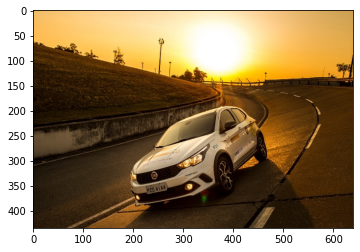

Tags da imagem: ['carro', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.82404697), ('n03670208', 'limousine', 0.038716547), ('n03770679', 'minivan', 0.026841346), ('n02965783', 'car_mirror', 0.013347836), ('n04037443', 'racer', 0.01275316)]
Predicoes modelo INCEPTION:
 [('n04285008', 'sports_car', 0.5744798), ('n02974003', 'car_wheel', 0.07395982), ('n04037443', 'racer', 0.055804968), ('n03100240', 'convertible', 0.041968558), ('n03770679', 'minivan', 0.021331439)]
Predicoes modelo RESNET:
 [('n03770679', 'minivan', 0.48981535), ('n02930766', 'cab', 0.16778064), ('n04467665', 'trailer_truck', 0.079406336), ('n03791053', 'motor_scooter', 0.041761514), ('n04254680', 'soccer_ball', 0.034938)]
Predicoes modelo MOBILENET:
 [('n04037443', 'racer', 0.6102685), ('n02930766', 'cab', 0.043369725), ('n03769881', 'minibus', 0.030501334), ('n03770679', 'minivan', 0.025618343), ('n02974003', 'car_wheel', 0.023139585)]

============ Index 58: carro-sol-3.jpeg ================


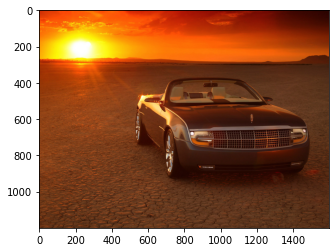

Tags da imagem: ['carro', 'sol']
Predicoes modelo VGG:
 [('n03770679', 'minivan', 0.2411934), ('n03100240', 'convertible', 0.22094683), ('n03459775', 'grille', 0.1374508), ('n04285008', 'sports_car', 0.12670569), ('n02814533', 'beach_wagon', 0.0787941)]
Predicoes modelo INCEPTION:
 [('n03100240', 'convertible', 0.91076934), ('n03459775', 'grille', 0.03116633), ('n04285008', 'sports_car', 0.019948503), ('n03594945', 'jeep', 0.0012375758), ('n02974003', 'car_wheel', 0.0012101479)]
Predicoes modelo RESNET:
 [('n03100240', 'convertible', 0.7990662), ('n03459775', 'grille', 0.07318751), ('n02974003', 'car_wheel', 0.05000774), ('n04285008', 'sports_car', 0.035295207), ('n03594945', 'jeep', 0.013489419)]
Predicoes modelo MOBILENET:
 [('n03100240', 'convertible', 0.572692), ('n04037443', 'racer', 0.17518383), ('n03459775', 'grille', 0.084791884), ('n02930766', 'cab', 0.047651086), ('n04285008', 'sports_car', 0.040149778)]

============ Index 59: carro-sol-4.jpeg ================


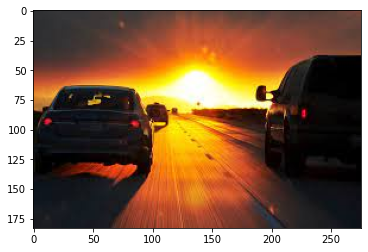

Tags da imagem: ['carro', 'sol']
Predicoes modelo VGG:
 [('n03594945', 'jeep', 0.5944495), ('n04252225', 'snowplow', 0.2239198), ('n02965783', 'car_mirror', 0.041868664), ('n03930630', 'pickup', 0.023601668), ('n04485082', 'tripod', 0.0136589985)]
Predicoes modelo INCEPTION:
 [('n04252225', 'snowplow', 0.20444722), ('n03594945', 'jeep', 0.09457151), ('n02965783', 'car_mirror', 0.07210918), ('n04467665', 'trailer_truck', 0.041521836), ('n03770679', 'minivan', 0.038717743)]
Predicoes modelo RESNET:
 [('n03770679', 'minivan', 0.6979641), ('n03594945', 'jeep', 0.13690367), ('n04252225', 'snowplow', 0.02931071), ('n02747177', 'ashcan', 0.02625589), ('n03417042', 'garbage_truck', 0.014394164)]
Predicoes modelo MOBILENET:
 [('n04252225', 'snowplow', 0.32781154), ('n04146614', 'school_bus', 0.0506633), ('n04461696', 'tow_truck', 0.049217943), ('n02930766', 'cab', 0.047612175), ('n04467665', 'trailer_truck', 0.04354484)]

============ Index 60: carro-sol-5.jpeg ================


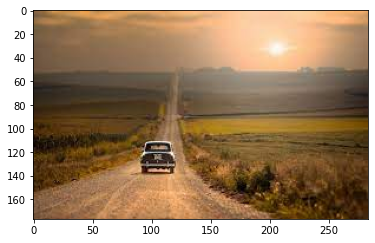

Tags da imagem: ['carro', 'sol']
Predicoes modelo VGG:
 [('n09472597', 'volcano', 0.059498597), ('n04146614', 'school_bus', 0.059482373), ('n04335435', 'streetcar', 0.056954704), ('n11879895', 'rapeseed', 0.05445481), ('n09288635', 'geyser', 0.04219877)]
Predicoes modelo INCEPTION:
 [('n03594945', 'jeep', 0.18098629), ('n04037443', 'racer', 0.08014741), ('n11879895', 'rapeseed', 0.043125693), ('n09468604', 'valley', 0.03903803), ('n04467665', 'trailer_truck', 0.036080576)]
Predicoes modelo RESNET:
 [('n03594945', 'jeep', 0.69111925), ('n04532670', 'viaduct', 0.056385268), ('n04467665', 'trailer_truck', 0.029796403), ('n03976657', 'pole', 0.015458613), ('n02701002', 'ambulance', 0.013611924)]
Predicoes modelo MOBILENET:
 [('n04037443', 'racer', 0.08898108), ('n04467665', 'trailer_truck', 0.08651098), ('n03496892', 'harvester', 0.05920539), ('n03444034', 'go-kart', 0.034536768), ('n11879895', 'rapeseed', 0.032372665)]

============ Index 61: carro-sol-6.jpeg ================


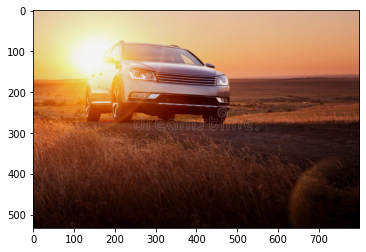

Tags da imagem: ['carro', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.6045299), ('n04465501', 'tractor', 0.1718804), ('n03594945', 'jeep', 0.049855318), ('n03496892', 'harvester', 0.040339), ('n04461696', 'tow_truck', 0.036854412)]
Predicoes modelo INCEPTION:
 [('n03930630', 'pickup', 0.48440903), ('n03594945', 'jeep', 0.088470325), ('n02974003', 'car_wheel', 0.031745497), ('n03459775', 'grille', 0.025333105), ('n02814533', 'beach_wagon', 0.022208698)]
Predicoes modelo RESNET:
 [('n03594945', 'jeep', 0.7477232), ('n03770679', 'minivan', 0.10498526), ('n03930630', 'pickup', 0.08811194), ('n04467665', 'trailer_truck', 0.020083733), ('n03496892', 'harvester', 0.007547614)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.40715033), ('n03770679', 'minivan', 0.03574224), ('n03930630', 'pickup', 0.029856648), ('n02814533', 'beach_wagon', 0.024772732), ('n03452741', 'grand_piano', 0.020195462)]

============ Index 62: carro-sol-7.jpeg ================


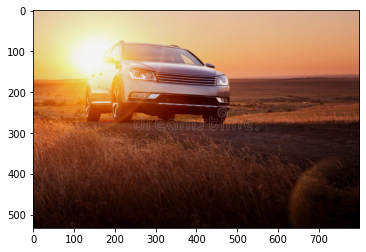

Tags da imagem: ['carro', 'sol']
Predicoes modelo VGG:
 [('n04467665', 'trailer_truck', 0.6045301), ('n04465501', 'tractor', 0.17188029), ('n03594945', 'jeep', 0.049855333), ('n03496892', 'harvester', 0.040339056), ('n04461696', 'tow_truck', 0.036854386)]
Predicoes modelo INCEPTION:
 [('n03930630', 'pickup', 0.48440892), ('n03594945', 'jeep', 0.08847035), ('n02974003', 'car_wheel', 0.031745505), ('n03459775', 'grille', 0.025333123), ('n02814533', 'beach_wagon', 0.022208715)]
Predicoes modelo RESNET:
 [('n03594945', 'jeep', 0.7477231), ('n03770679', 'minivan', 0.104985245), ('n03930630', 'pickup', 0.08811209), ('n04467665', 'trailer_truck', 0.020083768), ('n03496892', 'harvester', 0.0075476132)]
Predicoes modelo MOBILENET:
 [('n04467665', 'trailer_truck', 0.4071503), ('n03770679', 'minivan', 0.035742216), ('n03930630', 'pickup', 0.029856646), ('n02814533', 'beach_wagon', 0.024772706), ('n03452741', 'grand_piano', 0.02019547)]

============ Index 63: carro-sol-8.png ================


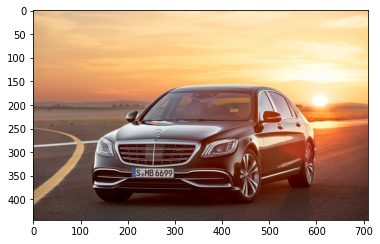

Tags da imagem: ['carro', 'sol']
Predicoes modelo VGG:
 [('n04285008', 'sports_car', 0.4890156), ('n03459775', 'grille', 0.11224802), ('n02974003', 'car_wheel', 0.08706607), ('n02814533', 'beach_wagon', 0.086918324), ('n03770679', 'minivan', 0.07343574)]
Predicoes modelo INCEPTION:
 [('n03459775', 'grille', 0.49215096), ('n02974003', 'car_wheel', 0.13871016), ('n03930630', 'pickup', 0.075316146), ('n02930766', 'cab', 0.074703276), ('n04285008', 'sports_car', 0.030314352)]
Predicoes modelo RESNET:
 [('n03770679', 'minivan', 0.63431704), ('n02974003', 'car_wheel', 0.16363761), ('n03930630', 'pickup', 0.0671276), ('n02814533', 'beach_wagon', 0.036754806), ('n04285008', 'sports_car', 0.029285045)]
Predicoes modelo MOBILENET:
 [('n02814533', 'beach_wagon', 0.3546112), ('n03459775', 'grille', 0.15557507), ('n04037443', 'racer', 0.11597213), ('n03770679', 'minivan', 0.11193978), ('n04285008', 'sports_car', 0.07254597)]

============ Index 64: carro-sol-mar-1.jpg ================


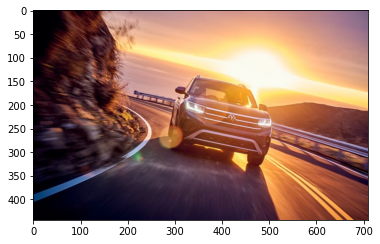

Tags da imagem: ['carro', 'mar', 'sol']
Predicoes modelo VGG:
 [('n02965783', 'car_mirror', 0.48876983), ('n03388043', 'fountain', 0.13424158), ('n03916031', 'perfume', 0.054724824), ('n02930766', 'cab', 0.032850355), ('n04146614', 'school_bus', 0.030440832)]
Predicoes modelo INCEPTION:
 [('n04461696', 'tow_truck', 0.3186138), ('n04252225', 'snowplow', 0.17182116), ('n03930630', 'pickup', 0.0682059), ('n02965783', 'car_mirror', 0.043679364), ('n04467665', 'trailer_truck', 0.033956703)]
Predicoes modelo RESNET:
 [('n02930766', 'cab', 0.88025385), ('n02965783', 'car_mirror', 0.050102692), ('n04366367', 'suspension_bridge', 0.015924128), ('n03770679', 'minivan', 0.01189011), ('n03594945', 'jeep', 0.009678019)]
Predicoes modelo MOBILENET:
 [('n02930766', 'cab', 0.2067328), ('n02965783', 'car_mirror', 0.19319738), ('n04146614', 'school_bus', 0.049453363), ('n03459775', 'grille', 0.03771462), ('n04355933', 'sunglass', 0.03163992)]

============ Index 65: casa-piscina-guarda sol-arvore-rede-1

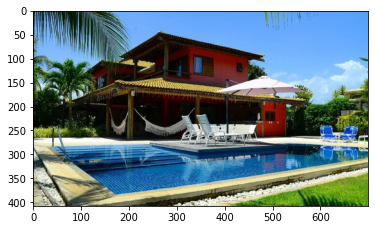

Tags da imagem: ['arvore', 'casa']
Predicoes modelo VGG:
 [('n02859443', 'boathouse', 0.34850135), ('n03899768', 'patio', 0.32665384), ('n09332890', 'lakeside', 0.12565938), ('n01806143', 'peacock', 0.036320213), ('n03388043', 'fountain', 0.021054916)]
Predicoes modelo INCEPTION:
 [('n03899768', 'patio', 0.811026), ('n02859443', 'boathouse', 0.10349164), ('n04258138', 'solar_dish', 0.012950897), ('n04239074', 'sliding_door', 0.008257898), ('n04081281', 'restaurant', 0.007079681)]
Predicoes modelo RESNET:
 [('n03899768', 'patio', 0.67553955), ('n02859443', 'boathouse', 0.12521228), ('n09332890', 'lakeside', 0.09697235), ('n04081281', 'restaurant', 0.026802171), ('n09428293', 'seashore', 0.016580317)]
Predicoes modelo MOBILENET:
 [('n02859443', 'boathouse', 0.65920246), ('n09332890', 'lakeside', 0.07955), ('n03899768', 'patio', 0.067173496), ('n04493381', 'tub', 0.008436933), ('n03388043', 'fountain', 0.008396863)]

============ Index 66: casa-praia-mar-sol-1.jpg ================


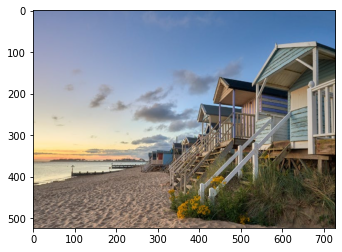

Tags da imagem: ['casa', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n03776460', 'mobile_home', 0.539899), ('n02859443', 'boathouse', 0.043874413), ('n03126707', 'crane', 0.029142022), ('n04417672', 'thatch', 0.026117545), ('n03930313', 'picket_fence', 0.021874024)]
Predicoes modelo INCEPTION:
 [('n03776460', 'mobile_home', 0.56929713), ('n02859443', 'boathouse', 0.115563974), ('n09428293', 'seashore', 0.09331745), ('n03899768', 'patio', 0.018402582), ('n02894605', 'breakwater', 0.01505543)]
Predicoes modelo RESNET:
 [('n03776460', 'mobile_home', 0.31755745), ('n03930313', 'picket_fence', 0.20295902), ('n09332890', 'lakeside', 0.15734093), ('n02859443', 'boathouse', 0.07342022), ('n02894605', 'breakwater', 0.027004225)]
Predicoes modelo MOBILENET:
 [('n02894605', 'breakwater', 0.2142559), ('n03776460', 'mobile_home', 0.09229579), ('n09428293', 'seashore', 0.066292666), ('n04258138', 'solar_dish', 0.045360286), ('n02814860', 'beacon', 0.042994633)]

============ Index 67: casa-prai

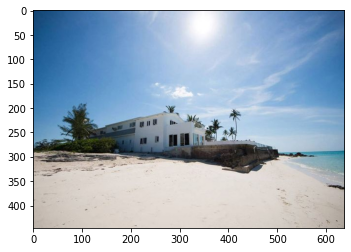

Tags da imagem: ['arvore', 'casa', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n09421951', 'sandbar', 0.49810362), ('n09428293', 'seashore', 0.16676667), ('n09332890', 'lakeside', 0.07570531), ('n04606251', 'wreck', 0.054092694), ('n02894605', 'breakwater', 0.051174145)]
Predicoes modelo INCEPTION:
 [('n09421951', 'sandbar', 0.73900586), ('n09428293', 'seashore', 0.15541203), ('n02894605', 'breakwater', 0.012998448), ('n02814860', 'beacon', 0.012221719), ('n03781244', 'monastery', 0.005488314)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.47781885), ('n03028079', 'church', 0.15521918), ('n02814860', 'beacon', 0.13411686), ('n09421951', 'sandbar', 0.045442052), ('n09246464', 'cliff', 0.03030866)]
Predicoes modelo MOBILENET:
 [('n04606251', 'wreck', 0.12516484), ('n02814860', 'beacon', 0.109635), ('n02894605', 'breakwater', 0.0621068), ('n02859443', 'boathouse', 0.05597723), ('n02793495', 'barn', 0.055382933)]

============ Index 68: casa-praia-mar-sol-arvore-2.jpg =======

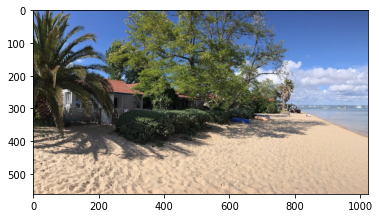

Tags da imagem: ['arvore', 'casa', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.23196226), ('n09421951', 'sandbar', 0.21222489), ('n09332890', 'lakeside', 0.14098167), ('n02894605', 'breakwater', 0.07151393), ('n03899768', 'patio', 0.04323363)]
Predicoes modelo INCEPTION:
 [('n09421951', 'sandbar', 0.5668451), ('n09428293', 'seashore', 0.16420667), ('n09332890', 'lakeside', 0.05148716), ('n02894605', 'breakwater', 0.0062471707), ('n09256479', 'coral_reef', 0.0055686613)]
Predicoes modelo RESNET:
 [('n09332890', 'lakeside', 0.42631367), ('n09428293', 'seashore', 0.23117763), ('n09421951', 'sandbar', 0.13790037), ('n02894605', 'breakwater', 0.13577834), ('n03899768', 'patio', 0.026424475)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.24696274), ('n03891251', 'park_bench', 0.1387392), ('n09428293', 'seashore', 0.10117846), ('n09421951', 'sandbar', 0.045410145), ('n02894605', 'breakwater', 0.042527255)]

============ Index 69: cavalo-arvore-sol-1.

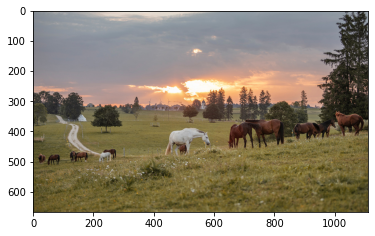

Tags da imagem: ['arvore', 'cavalo', 'sol']
Predicoes modelo VGG:
 [('n02408429', 'water_buffalo', 0.39063966), ('n02403003', 'ox', 0.18111853), ('n09332890', 'lakeside', 0.07951387), ('n02415577', 'bighorn', 0.048790738), ('n01871265', 'tusker', 0.035832737)]
Predicoes modelo INCEPTION:
 [('n02403003', 'ox', 0.20054334), ('n02410509', 'bison', 0.07767016), ('n02408429', 'water_buffalo', 0.062427763), ('n02437616', 'llama', 0.048944183), ('n07802026', 'hay', 0.047405723)]
Predicoes modelo RESNET:
 [('n02437616', 'llama', 0.39408535), ('n02412080', 'ram', 0.1667975), ('n02099849', 'Chesapeake_Bay_retriever', 0.079498366), ('n02504013', 'Indian_elephant', 0.049002707), ('n09332890', 'lakeside', 0.040396266)]
Predicoes modelo MOBILENET:
 [('n02403003', 'ox', 0.1395357), ('n02437616', 'llama', 0.13124715), ('n02412080', 'ram', 0.1292887), ('n02408429', 'water_buffalo', 0.04959871), ('n02415577', 'bighorn', 0.04922071)]

============ Index 70: cavalo-sol-arvore-1.jpg ================


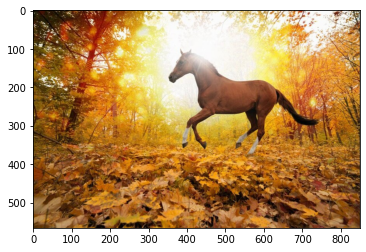

Tags da imagem: ['arvore', 'cavalo', 'sol']
Predicoes modelo VGG:
 [('n02415577', 'bighorn', 0.25734904), ('n02422106', 'hartebeest', 0.12476684), ('n02408429', 'water_buffalo', 0.08911694), ('n01871265', 'tusker', 0.06809024), ('n02403003', 'ox', 0.05117616)]
Predicoes modelo INCEPTION:
 [('n02389026', 'sorrel', 0.27264386), ('n02422106', 'hartebeest', 0.14568974), ('n02100583', 'vizsla', 0.020457672), ('n02437312', 'Arabian_camel', 0.013932585), ('n02415577', 'bighorn', 0.013359091)]
Predicoes modelo RESNET:
 [('n02422106', 'hartebeest', 0.19598205), ('n02408429', 'water_buffalo', 0.09429211), ('n02092339', 'Weimaraner', 0.09163625), ('n02504458', 'African_elephant', 0.062987365), ('n04604644', 'worm_fence', 0.044271797)]
Predicoes modelo MOBILENET:
 [('n02092339', 'Weimaraner', 0.21660918), ('n02113978', 'Mexican_hairless', 0.14558889), ('n02100583', 'vizsla', 0.13400355), ('n02417914', 'ibex', 0.038243983), ('n02087394', 'Rhodesian_ridgeback', 0.036120538)]

============ Index 71: 

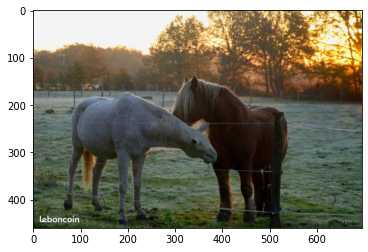

Tags da imagem: ['arvore', 'cavalo', 'sol']
Predicoes modelo VGG:
 [('n02408429', 'water_buffalo', 0.4335893), ('n04604644', 'worm_fence', 0.09312869), ('n02403003', 'ox', 0.0741757), ('n02012849', 'crane', 0.046714395), ('n02422106', 'hartebeest', 0.03342471)]
Predicoes modelo INCEPTION:
 [('n02389026', 'sorrel', 0.24909763), ('n04604644', 'worm_fence', 0.15738244), ('n02403003', 'ox', 0.11377134), ('n02408429', 'water_buffalo', 0.08757139), ('n03967562', 'plow', 0.020245064)]
Predicoes modelo RESNET:
 [('n02403003', 'ox', 0.25272945), ('n02408429', 'water_buffalo', 0.23169585), ('n04604644', 'worm_fence', 0.21774405), ('n02389026', 'sorrel', 0.11020209), ('n03967562', 'plow', 0.053029966)]
Predicoes modelo MOBILENET:
 [('n02408429', 'water_buffalo', 0.72562003), ('n02403003', 'ox', 0.02909883), ('n03967562', 'plow', 0.024034357), ('n02389026', 'sorrel', 0.023251018), ('n04604644', 'worm_fence', 0.009429697)]

============ Index 72: mar-arvore-sol-1.jpg ================


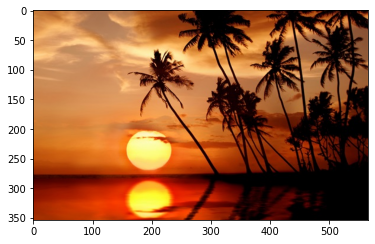

Tags da imagem: ['arvore', 'mar', 'sol']
Predicoes modelo VGG:
 [('n04286575', 'spotlight', 0.19974881), ('n09428293', 'seashore', 0.16081662), ('n03637318', 'lampshade', 0.15550639), ('n09472597', 'volcano', 0.076175354), ('n02782093', 'balloon', 0.07491023)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.40179744), ('n09332890', 'lakeside', 0.063144185), ('n09399592', 'promontory', 0.039436225), ('n03942813', 'ping-pong_ball', 0.026656518), ('n02814860', 'beacon', 0.021934194)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.7517776), ('n03637318', 'lampshade', 0.048416007), ('n04286575', 'spotlight', 0.03005734), ('n04485082', 'tripod', 0.029369295), ('n03956157', 'planetarium', 0.023948036)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.5328428), ('n04286575', 'spotlight', 0.06835309), ('n04522168', 'vase', 0.067409635), ('n03637318', 'lampshade', 0.03213072), ('n09229709', 'bubble', 0.021467986)]

============ Index 73: mar-ave-sol-1.jpg =============

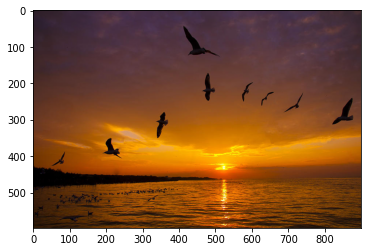

Tags da imagem: ['ave', 'mar', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.48679352), ('n03888257', 'parachute', 0.11204539), ('n09332890', 'lakeside', 0.06748537), ('n02051845', 'pelican', 0.05995705), ('n03947888', 'pirate', 0.03981052)]
Predicoes modelo INCEPTION:
 [('n02051845', 'pelican', 0.9830335), ('n01855672', 'goose', 0.009736353), ('n02012849', 'crane', 0.0029396906), ('n01608432', 'kite', 0.00067004614), ('n02007558', 'flamingo', 0.0006340035)]
Predicoes modelo RESNET:
 [('n02051845', 'pelican', 0.9811716), ('n09428293', 'seashore', 0.0035412465), ('n01855672', 'goose', 0.0031925475), ('n03947888', 'pirate', 0.0029458848), ('n02007558', 'flamingo', 0.002192865)]
Predicoes modelo MOBILENET:
 [('n04552348', 'warplane', 0.2082377), ('n04592741', 'wing', 0.11268856), ('n02687172', 'aircraft_carrier', 0.077120505), ('n03888257', 'parachute', 0.06195726), ('n04606251', 'wreck', 0.042508997)]

============ Index 74: mar-ave-sol-2.jpg ================


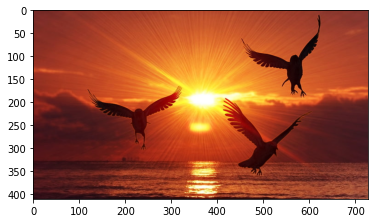

Tags da imagem: ['ave', 'mar', 'sol']
Predicoes modelo VGG:
 [('n03388043', 'fountain', 0.46057135), ('n03888257', 'parachute', 0.31262195), ('n04456115', 'torch', 0.06003423), ('n09428293', 'seashore', 0.03828993), ('n02782093', 'balloon', 0.03278158)]
Predicoes modelo INCEPTION:
 [('n02012849', 'crane', 0.18436138), ('n02051845', 'pelican', 0.0787198), ('n01514668', 'cock', 0.07434654), ('n03388043', 'fountain', 0.074142806), ('n09428293', 'seashore', 0.072341554)]
Predicoes modelo RESNET:
 [('n04485082', 'tripod', 0.18086553), ('n03947888', 'pirate', 0.15907228), ('n04456115', 'torch', 0.13891001), ('n04371774', 'swing', 0.120521024), ('n02233338', 'cockroach', 0.109764956)]
Predicoes modelo MOBILENET:
 [('n04606251', 'wreck', 0.42073646), ('n04371774', 'swing', 0.1970935), ('n03388043', 'fountain', 0.093043745), ('n02782093', 'balloon', 0.031382926), ('n02687172', 'aircraft_carrier', 0.020924294)]

============ Index 75: mar-cavalo-sol-1.jpg ================


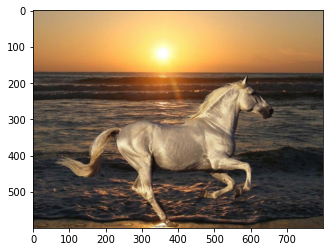

Tags da imagem: ['cavalo', 'mar', 'sol']
Predicoes modelo VGG:
 [('n02437312', 'Arabian_camel', 0.98916084), ('n02091831', 'Saluki', 0.0056720227), ('n02090721', 'Irish_wolfhound', 0.0014477865), ('n09428293', 'seashore', 0.0006168038), ('n03903868', 'pedestal', 0.00047341583)]
Predicoes modelo INCEPTION:
 [('n02109047', 'Great_Dane', 0.14890575), ('n02091134', 'whippet', 0.11817981), ('n02091831', 'Saluki', 0.09160691), ('n02389026', 'sorrel', 0.05597375), ('n09428293', 'seashore', 0.04462461)]
Predicoes modelo RESNET:
 [('n02437312', 'Arabian_camel', 0.15983732), ('n09428293', 'seashore', 0.0992604), ('n02091831', 'Saluki', 0.085236736), ('n09332890', 'lakeside', 0.08356395), ('n02110958', 'pug', 0.053053144)]
Predicoes modelo MOBILENET:
 [('n02397096', 'warthog', 0.42725375), ('n02109047', 'Great_Dane', 0.1121865), ('n02437312', 'Arabian_camel', 0.061355058), ('n02113978', 'Mexican_hairless', 0.04368507), ('n02129165', 'lion', 0.033294074)]

============ Index 76: mar-ponte-sol-1.jp

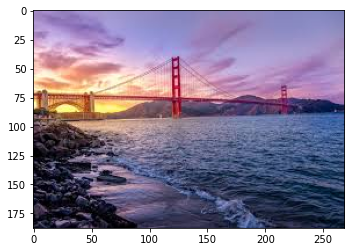

Tags da imagem: ['mar', 'ponte', 'sol']
Predicoes modelo VGG:
 [('n03933933', 'pier', 0.54929274), ('n09399592', 'promontory', 0.08888915), ('n02894605', 'breakwater', 0.06136748), ('n03344393', 'fireboat', 0.040377636), ('n02814860', 'beacon', 0.03641007)]
Predicoes modelo INCEPTION:
 [('n03933933', 'pier', 0.7362696), ('n09399592', 'promontory', 0.09643889), ('n04366367', 'suspension_bridge', 0.031090684), ('n03095699', 'container_ship', 0.014795246), ('n04311004', 'steel_arch_bridge', 0.007069455)]
Predicoes modelo RESNET:
 [('n03933933', 'pier', 0.8256617), ('n04366367', 'suspension_bridge', 0.09261848), ('n03126707', 'crane', 0.044893038), ('n04311004', 'steel_arch_bridge', 0.0191586), ('n03160309', 'dam', 0.0074722613)]
Predicoes modelo MOBILENET:
 [('n03933933', 'pier', 0.5579765), ('n04366367', 'suspension_bridge', 0.19136254), ('n03126707', 'crane', 0.028006306), ('n03095699', 'container_ship', 0.026384002), ('n09399592', 'promontory', 0.01648332)]

============ Index 77: mar-

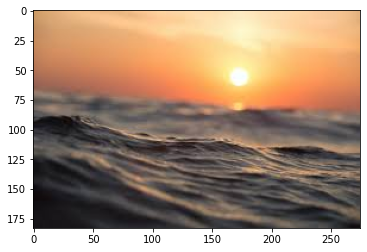

Tags da imagem: ['mar', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.14101978), ('n02894605', 'breakwater', 0.12871543), ('n09472597', 'volcano', 0.12462755), ('n02814860', 'beacon', 0.108342126), ('n04606251', 'wreck', 0.028644046)]
Predicoes modelo INCEPTION:
 [('n09472597', 'volcano', 0.34183803), ('n01665541', 'leatherback_turtle', 0.08401992), ('n03240683', 'drilling_platform', 0.0601052), ('n09428293', 'seashore', 0.033318155), ('n01484850', 'great_white_shark', 0.023052886)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.61692655), ('n02814860', 'beacon', 0.1337118), ('n09399592', 'promontory', 0.047696102), ('n09332890', 'lakeside', 0.026330646), ('n03240683', 'drilling_platform', 0.021994581)]
Predicoes modelo MOBILENET:
 [('n09472597', 'volcano', 0.55516285), ('n09428293', 'seashore', 0.07548554), ('n02814860', 'beacon', 0.053161815), ('n09399592', 'promontory', 0.042383105), ('n09332890', 'lakeside', 0.034598418)]

============ Index 78: mar-sol-2.jpg =

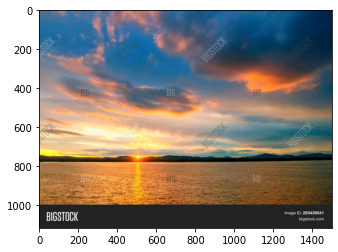

Tags da imagem: ['mar', 'sol']
Predicoes modelo VGG:
 [('n09332890', 'lakeside', 0.26434323), ('n09428293', 'seashore', 0.13660362), ('n03782006', 'monitor', 0.108271666), ('n02782093', 'balloon', 0.09380584), ('n04404412', 'television', 0.05332376)]
Predicoes modelo INCEPTION:
 [('n09332890', 'lakeside', 0.9245653), ('n02859443', 'boathouse', 0.01941409), ('n09428293', 'seashore', 0.01000051), ('n02894605', 'breakwater', 0.003972916), ('n03216828', 'dock', 0.0033993982)]
Predicoes modelo RESNET:
 [('n02782093', 'balloon', 0.23992184), ('n09428293', 'seashore', 0.22003809), ('n02894605', 'breakwater', 0.16818134), ('n09332890', 'lakeside', 0.14126705), ('n02859443', 'boathouse', 0.022059709)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.6505764), ('n03976657', 'pole', 0.062409546), ('n09332890', 'lakeside', 0.056520846), ('n02814860', 'beacon', 0.029312229), ('n04467665', 'trailer_truck', 0.015879018)]

============ Index 79: mar-sol-arvore-1.jpg ================


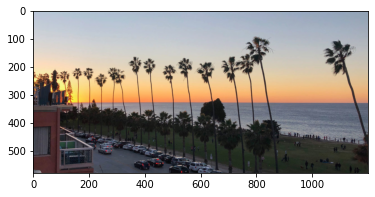

Tags da imagem: ['arvore', 'mar', 'sol']
Predicoes modelo VGG:
 [('n03216828', 'dock', 0.48240462), ('n09332890', 'lakeside', 0.14877479), ('n09428293', 'seashore', 0.07243101), ('n02894605', 'breakwater', 0.063712545), ('n04147183', 'schooner', 0.024350546)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.35031128), ('n09332890', 'lakeside', 0.25233167), ('n03216828', 'dock', 0.03791156), ('n02859443', 'boathouse', 0.024163343), ('n04371774', 'swing', 0.020480298)]
Predicoes modelo RESNET:
 [('n04371774', 'swing', 0.28654596), ('n03216828', 'dock', 0.25297457), ('n09332890', 'lakeside', 0.19472297), ('n02859443', 'boathouse', 0.11332804), ('n03126707', 'crane', 0.073866084)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.4271053), ('n09428293', 'seashore', 0.22286955), ('n03216828', 'dock', 0.033899903), ('n03877845', 'palace', 0.024092875), ('n02859443', 'boathouse', 0.020062476)]

============ Index 80: mar-sol-ave-2.jpg ================


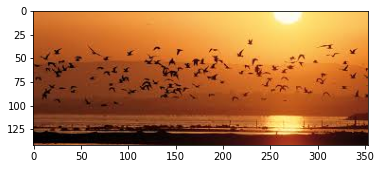

Tags da imagem: ['ave', 'mar', 'sol']
Predicoes modelo VGG:
 [('n03673027', 'liner', 0.2960872), ('n09428293', 'seashore', 0.13801004), ('n03637318', 'lampshade', 0.06463227), ('n03388043', 'fountain', 0.034460567), ('n07565083', 'menu', 0.03348034)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.16434129), ('n04418357', 'theater_curtain', 0.15032429), ('n09246464', 'cliff', 0.086067215), ('n02948072', 'candle', 0.041693214), ('n03032252', 'cinema', 0.02641031)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.728421), ('n09332890', 'lakeside', 0.044719044), ('n04418357', 'theater_curtain', 0.037984822), ('n09246464', 'cliff', 0.03287817), ('n02782093', 'balloon', 0.02916817)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.09778423), ('n03598930', 'jigsaw_puzzle', 0.078361854), ('n02687172', 'aircraft_carrier', 0.047189407), ('n09332890', 'lakeside', 0.03903253), ('n03393912', 'freight_car', 0.02403624)]

============ Index 81: montanha-estrada-casa-arvore-s

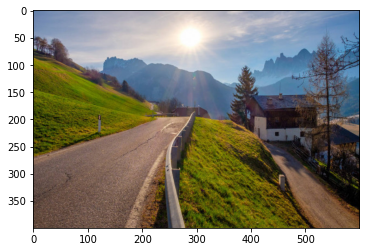

Tags da imagem: ['arvore', 'casa', 'montanha', 'sol']
Predicoes modelo VGG:
 [('n09193705', 'alp', 0.5727031), ('n09468604', 'valley', 0.1276172), ('n02980441', 'castle', 0.049804237), ('n03028079', 'church', 0.043341085), ('n04335435', 'streetcar', 0.0242842)]
Predicoes modelo INCEPTION:
 [('n09193705', 'alp', 0.5535654), ('n09468604', 'valley', 0.18985216), ('n09246464', 'cliff', 0.022659412), ('n03160309', 'dam', 0.005511982), ('n09332890', 'lakeside', 0.0054888255)]
Predicoes modelo RESNET:
 [('n09193705', 'alp', 0.44156688), ('n09468604', 'valley', 0.15113242), ('n02980441', 'castle', 0.11191338), ('n09332890', 'lakeside', 0.050697617), ('n03028079', 'church', 0.030472878)]
Predicoes modelo MOBILENET:
 [('n09193705', 'alp', 0.2520046), ('n09468604', 'valley', 0.09071227), ('n09332890', 'lakeside', 0.0701186), ('n02980441', 'castle', 0.03947069), ('n02894605', 'breakwater', 0.02278758)]

============ Index 82: montanha-flor-sol-1.jpg ================


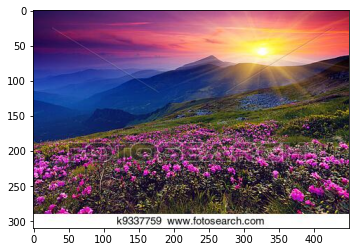

Tags da imagem: ['montanha', 'sol']
Predicoes modelo VGG:
 [('n09472597', 'volcano', 0.8227169), ('n09468604', 'valley', 0.08152987), ('n09193705', 'alp', 0.05581998), ('n02793495', 'barn', 0.009579766), ('n09332890', 'lakeside', 0.0046399883)]
Predicoes modelo INCEPTION:
 [('n09468604', 'valley', 0.5068716), ('n09472597', 'volcano', 0.16915911), ('n09193705', 'alp', 0.061099607), ('n09332890', 'lakeside', 0.00844761), ('n09399592', 'promontory', 0.0057987995)]
Predicoes modelo RESNET:
 [('n09472597', 'volcano', 0.60197484), ('n09193705', 'alp', 0.0720733), ('n02793495', 'barn', 0.06106355), ('n02980441', 'castle', 0.059508726), ('n09468604', 'valley', 0.030426988)]
Predicoes modelo MOBILENET:
 [('n09472597', 'volcano', 0.3225572), ('n09468604', 'valley', 0.1807359), ('n09193705', 'alp', 0.16508551), ('n09246464', 'cliff', 0.03116361), ('n02793495', 'barn', 0.01738231)]

============ Index 83: montanha-sol-1.jpg ================


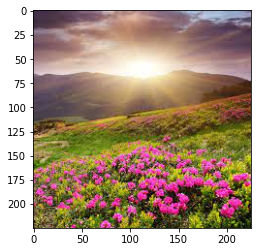

Tags da imagem: ['montanha', 'sol']
Predicoes modelo VGG:
 [('n09472597', 'volcano', 0.8406052), ('n09468604', 'valley', 0.05164286), ('n02793495', 'barn', 0.020616377), ('n09399592', 'promontory', 0.014402917), ('n09193705', 'alp', 0.014205147)]
Predicoes modelo INCEPTION:
 [('n09468604', 'valley', 0.27303714), ('n09193705', 'alp', 0.18910438), ('n09399592', 'promontory', 0.18247327), ('n09472597', 'volcano', 0.096812524), ('n09246464', 'cliff', 0.018447626)]
Predicoes modelo RESNET:
 [('n04326547', 'stone_wall', 0.30179447), ('n02980441', 'castle', 0.15836887), ('n09472597', 'volcano', 0.106669456), ('n02793495', 'barn', 0.0995502), ('n09468604', 'valley', 0.06748024)]
Predicoes modelo MOBILENET:
 [('n09468604', 'valley', 0.201694), ('n09399592', 'promontory', 0.085561745), ('n04326547', 'stone_wall', 0.04208931), ('n09472597', 'volcano', 0.0350384), ('n04604644', 'worm_fence', 0.031192612)]

============ Index 84: ponte-caminhao-rio-sol-1.jpg ================


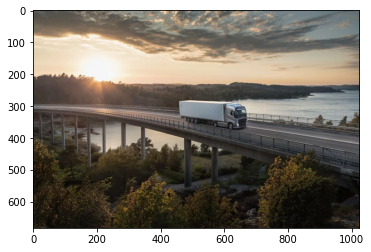

Tags da imagem: ['caminhao', 'ponte', 'rio', 'sol']
Predicoes modelo VGG:
 [('n04532670', 'viaduct', 0.637227), ('n04311004', 'steel_arch_bridge', 0.17461552), ('n04366367', 'suspension_bridge', 0.12664743), ('n03933933', 'pier', 0.016636578), ('n03160309', 'dam', 0.010549801)]
Predicoes modelo INCEPTION:
 [('n04467665', 'trailer_truck', 0.88219595), ('n03933933', 'pier', 0.034735862), ('n04311004', 'steel_arch_bridge', 0.009920952), ('n04310018', 'steam_locomotive', 0.0070175696), ('n04532670', 'viaduct', 0.004293147)]
Predicoes modelo RESNET:
 [('n02894605', 'breakwater', 0.34411746), ('n03216828', 'dock', 0.2276181), ('n03933933', 'pier', 0.095154114), ('n03899768', 'patio', 0.06796896), ('n03126707', 'crane', 0.039491262)]
Predicoes modelo MOBILENET:
 [('n04311004', 'steel_arch_bridge', 0.42046264), ('n04532670', 'viaduct', 0.12217335), ('n03933933', 'pier', 0.094416395), ('n02894605', 'breakwater', 0.013837791), ('n04366367', 'suspension_bridge', 0.009364439)]

============ Index 

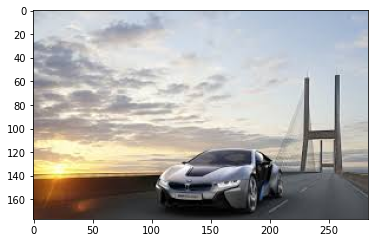

Tags da imagem: ['carro', 'ponte', 'sol']
Predicoes modelo VGG:
 [('n03445924', 'golfcart', 0.24728735), ('n03770679', 'minivan', 0.088922046), ('n04467665', 'trailer_truck', 0.05179417), ('n03791053', 'motor_scooter', 0.04456029), ('n03216828', 'dock', 0.036786806)]
Predicoes modelo INCEPTION:
 [('n04285008', 'sports_car', 0.42643976), ('n03770679', 'minivan', 0.08945119), ('n02974003', 'car_wheel', 0.044744875), ('n04037443', 'racer', 0.02756904), ('n04461696', 'tow_truck', 0.027142156)]
Predicoes modelo RESNET:
 [('n04285008', 'sports_car', 0.38898572), ('n03770679', 'minivan', 0.24609672), ('n04467665', 'trailer_truck', 0.1442537), ('n04037443', 'racer', 0.027543353), ('n03594945', 'jeep', 0.019540291)]
Predicoes modelo MOBILENET:
 [('n04285008', 'sports_car', 0.49955496), ('n03770679', 'minivan', 0.061524414), ('n04037443', 'racer', 0.061460752), ('n02974003', 'car_wheel', 0.01897419), ('n02930766', 'cab', 0.018773569)]

============ Index 86: ponte-mar-sol-1.jpg ================


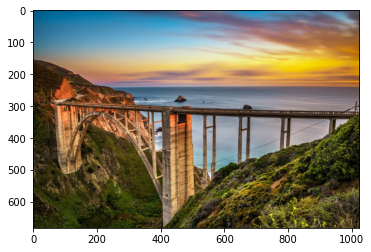

Tags da imagem: ['mar', 'ponte', 'sol']
Predicoes modelo VGG:
 [('n04311004', 'steel_arch_bridge', 0.7597737), ('n03933933', 'pier', 0.09267526), ('n04366367', 'suspension_bridge', 0.05660842), ('n03160309', 'dam', 0.028609315), ('n09399592', 'promontory', 0.023780784)]
Predicoes modelo INCEPTION:
 [('n04311004', 'steel_arch_bridge', 0.6498644), ('n03933933', 'pier', 0.049178418), ('n09246464', 'cliff', 0.020217255), ('n09399592', 'promontory', 0.019130161), ('n03160309', 'dam', 0.01436675)]
Predicoes modelo RESNET:
 [('n03933933', 'pier', 0.5082201), ('n04311004', 'steel_arch_bridge', 0.29408136), ('n03160309', 'dam', 0.10711203), ('n04532670', 'viaduct', 0.018347876), ('n02788148', 'bannister', 0.018029446)]
Predicoes modelo MOBILENET:
 [('n04311004', 'steel_arch_bridge', 0.45685494), ('n04532670', 'viaduct', 0.28848344), ('n03933933', 'pier', 0.06536476), ('n03160309', 'dam', 0.049936105), ('n04366367', 'suspension_bridge', 0.004749907)]

============ Index 87: ponte-rio-sol-1.jpg =

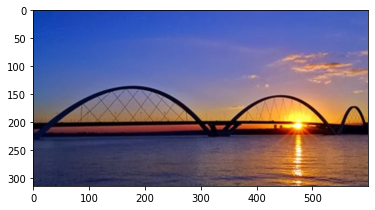

Tags da imagem: ['ponte', 'rio', 'sol']
Predicoes modelo VGG:
 [('n04311004', 'steel_arch_bridge', 0.950363), ('n03933933', 'pier', 0.042932265), ('n09428293', 'seashore', 0.0014193497), ('n03344393', 'fireboat', 0.0010389166), ('n09332890', 'lakeside', 0.0009392797)]
Predicoes modelo INCEPTION:
 [('n04311004', 'steel_arch_bridge', 0.9694342), ('n03933933', 'pier', 0.0044581383), ('n04542943', 'waffle_iron', 0.00084151427), ('n04523525', 'vault', 0.00024587562), ('n03085013', 'computer_keyboard', 0.00023316852)]
Predicoes modelo RESNET:
 [('n04311004', 'steel_arch_bridge', 0.999803), ('n03933933', 'pier', 0.00017658739), ('n03344393', 'fireboat', 1.1343884e-05), ('n03388043', 'fountain', 6.849982e-06), ('n02879718', 'bow', 6.6777335e-07)]
Predicoes modelo MOBILENET:
 [('n04311004', 'steel_arch_bridge', 0.9490538), ('n03933933', 'pier', 0.0074548125), ('n04039381', 'racket', 0.000584668), ('n03344393', 'fireboat', 0.0005653167), ('n03000134', 'chainlink_fence', 0.0005344074)]

=========

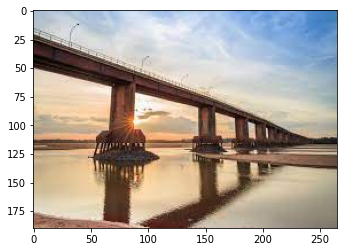

Tags da imagem: ['ponte', 'rio', 'sol']
Predicoes modelo VGG:
 [('n03933933', 'pier', 0.91075814), ('n04311004', 'steel_arch_bridge', 0.05923119), ('n04532670', 'viaduct', 0.008537905), ('n03160309', 'dam', 0.005492158), ('n02859443', 'boathouse', 0.00506219)]
Predicoes modelo INCEPTION:
 [('n03933933', 'pier', 0.5778941), ('n04532670', 'viaduct', 0.09514328), ('n04311004', 'steel_arch_bridge', 0.04354212), ('n03160309', 'dam', 0.011378905), ('n09468604', 'valley', 0.006996601)]
Predicoes modelo RESNET:
 [('n03933933', 'pier', 0.90287703), ('n04311004', 'steel_arch_bridge', 0.0650611), ('n04532670', 'viaduct', 0.009851944), ('n02859443', 'boathouse', 0.0060125245), ('n09332890', 'lakeside', 0.0057453713)]
Predicoes modelo MOBILENET:
 [('n03933933', 'pier', 0.8999215), ('n04311004', 'steel_arch_bridge', 0.042247895), ('n04532670', 'viaduct', 0.006723383), ('n04366367', 'suspension_bridge', 0.004488107), ('n03160309', 'dam', 0.0023445424)]

============ Index 89: ponte-rio-sol-3.jpg ====

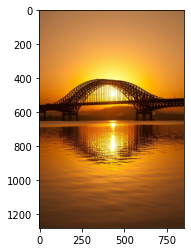

Tags da imagem: ['ponte', 'rio', 'sol']
Predicoes modelo VGG:
 [('n04311004', 'steel_arch_bridge', 0.57563436), ('n03933933', 'pier', 0.41239923), ('n04366367', 'suspension_bridge', 0.011580977), ('n03673027', 'liner', 6.3538144e-05), ('n09332890', 'lakeside', 5.42436e-05)]
Predicoes modelo INCEPTION:
 [('n04311004', 'steel_arch_bridge', 0.8445281), ('n03933933', 'pier', 0.11889923), ('n04366367', 'suspension_bridge', 0.0023556296), ('n03673027', 'liner', 0.0010261001), ('n04542943', 'waffle_iron', 0.0005781782)]
Predicoes modelo RESNET:
 [('n04311004', 'steel_arch_bridge', 0.9353461), ('n03933933', 'pier', 0.06051129), ('n04366367', 'suspension_bridge', 0.002130034), ('n09428293', 'seashore', 0.001271124), ('n03673027', 'liner', 0.00023272204)]
Predicoes modelo MOBILENET:
 [('n04311004', 'steel_arch_bridge', 0.86359245), ('n03933933', 'pier', 0.034853578), ('n04366367', 'suspension_bridge', 0.009207436), ('n09428293', 'seashore', 0.0023058862), ('n03673027', 'liner', 0.0020307105)]

=

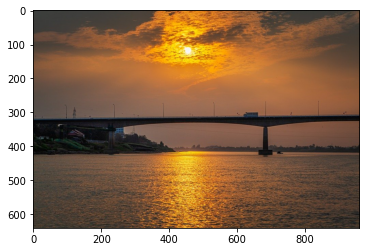

Tags da imagem: ['ponte', 'rio', 'sol']
Predicoes modelo VGG:
 [('n03933933', 'pier', 0.5498242), ('n09332890', 'lakeside', 0.092272356), ('n09428293', 'seashore', 0.060091514), ('n02894605', 'breakwater', 0.047447123), ('n03126707', 'crane', 0.045721885)]
Predicoes modelo INCEPTION:
 [('n03933933', 'pier', 0.54620016), ('n04366367', 'suspension_bridge', 0.18068269), ('n04311004', 'steel_arch_bridge', 0.03472684), ('n09399592', 'promontory', 0.008765214), ('n03126707', 'crane', 0.0070432965)]
Predicoes modelo RESNET:
 [('n09332890', 'lakeside', 0.590566), ('n02894605', 'breakwater', 0.17498785), ('n02859443', 'boathouse', 0.1042551), ('n03933933', 'pier', 0.048497096), ('n03216828', 'dock', 0.02686524)]
Predicoes modelo MOBILENET:
 [('n02894605', 'breakwater', 0.24062806), ('n09332890', 'lakeside', 0.14822587), ('n09428293', 'seashore', 0.1288195), ('n03216828', 'dock', 0.07389292), ('n03933933', 'pier', 0.046952937)]

============ Index 91: ponte-rio-sol-5.jpg ================


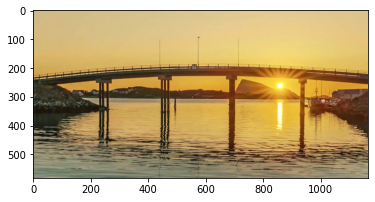

Tags da imagem: ['ponte', 'rio', 'sol']
Predicoes modelo VGG:
 [('n03933933', 'pier', 0.5168135), ('n04311004', 'steel_arch_bridge', 0.44808924), ('n03216828', 'dock', 0.004999097), ('n03874293', 'paddlewheel', 0.004370381), ('n04532670', 'viaduct', 0.004112435)]
Predicoes modelo INCEPTION:
 [('n04311004', 'steel_arch_bridge', 0.8040977), ('n03933933', 'pier', 0.1809464), ('n03673027', 'liner', 0.00034635182), ('n03874293', 'paddlewheel', 0.00017131357), ('n02951358', 'canoe', 0.00016188875)]
Predicoes modelo RESNET:
 [('n04311004', 'steel_arch_bridge', 0.8565637), ('n03933933', 'pier', 0.13933738), ('n03216828', 'dock', 0.0011100937), ('n03344393', 'fireboat', 0.0004832074), ('n04532670', 'viaduct', 0.00047915222)]
Predicoes modelo MOBILENET:
 [('n03933933', 'pier', 0.48005787), ('n04311004', 'steel_arch_bridge', 0.41706997), ('n04532670', 'viaduct', 0.008913293), ('n03874293', 'paddlewheel', 0.0025552225), ('n04483307', 'trimaran', 0.0018422876)]

============ Index 92: ponte-rio-sol

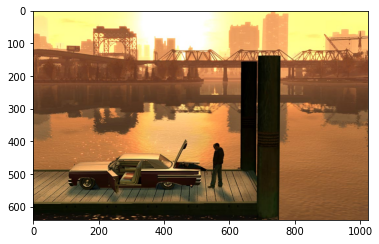

Tags da imagem: ['carro', 'ponte', 'rio', 'sol']
Predicoes modelo VGG:
 [('n02980441', 'castle', 0.18660197), ('n03782006', 'monitor', 0.1191362), ('n09332890', 'lakeside', 0.08606416), ('n02841315', 'binoculars', 0.08092987), ('n04266014', 'space_shuttle', 0.06619214)]
Predicoes modelo INCEPTION:
 [('n03216828', 'dock', 0.33737502), ('n02859443', 'boathouse', 0.05831711), ('n03445924', 'golfcart', 0.050090853), ('n03594945', 'jeep', 0.033344496), ('n02704792', 'amphibian', 0.026268791)]
Predicoes modelo RESNET:
 [('n03445924', 'golfcart', 0.47996733), ('n03594945', 'jeep', 0.15447392), ('n03478589', 'half_track', 0.108686596), ('n03899768', 'patio', 0.036695775), ('n03393912', 'freight_car', 0.035512842)]
Predicoes modelo MOBILENET:
 [('n02859443', 'boathouse', 0.105949484), ('n03445924', 'golfcart', 0.08982127), ('n03478589', 'half_track', 0.04726498), ('n03216828', 'dock', 0.033074785), ('n03594945', 'jeep', 0.02793116)]

============ Index 93: ponte-sol-1.jpg ================


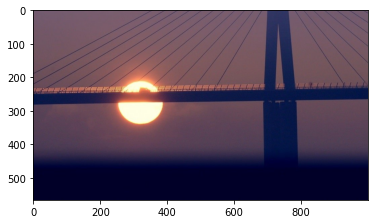

Tags da imagem: ['ponte', 'sol']
Predicoes modelo VGG:
 [('n03933933', 'pier', 0.4590352), ('n04366367', 'suspension_bridge', 0.20401621), ('n03637318', 'lampshade', 0.04710114), ('n04456115', 'torch', 0.040771697), ('n03126707', 'crane', 0.037780903)]
Predicoes modelo INCEPTION:
 [('n03933933', 'pier', 0.5978619), ('n04366367', 'suspension_bridge', 0.31678253), ('n04355338', 'sundial', 0.003042033), ('n02948072', 'candle', 0.002285595), ('n02730930', 'apron', 0.0014275552)]
Predicoes modelo RESNET:
 [('n03933933', 'pier', 0.7857439), ('n04366367', 'suspension_bridge', 0.17692587), ('n03095699', 'container_ship', 0.009258493), ('n04311004', 'steel_arch_bridge', 0.0074045835), ('n03126707', 'crane', 0.0031203772)]
Predicoes modelo MOBILENET:
 [('n04456115', 'torch', 0.32322487), ('n04366367', 'suspension_bridge', 0.13842764), ('n03933933', 'pier', 0.080934785), ('n04286575', 'spotlight', 0.046384018), ('n04532670', 'viaduct', 0.02396483)]

============ Index 94: praia-arvore-sol-1.jpg =

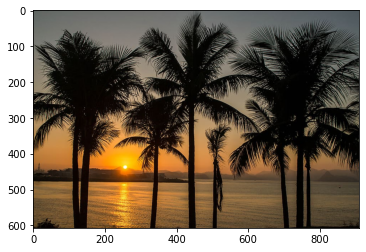

Tags da imagem: ['arvore', 'praia', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.41749382), ('n09332890', 'lakeside', 0.34762564), ('n03355925', 'flagpole', 0.088950954), ('n03976657', 'pole', 0.06090036), ('n03388043', 'fountain', 0.0139764445)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.5811891), ('n09332890', 'lakeside', 0.30785465), ('n03891251', 'park_bench', 0.011064022), ('n03877845', 'palace', 0.0076457052), ('n03388043', 'fountain', 0.0056030126)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.89251125), ('n09332890', 'lakeside', 0.061983347), ('n04371774', 'swing', 0.028897872), ('n04485082', 'tripod', 0.003635803), ('n02814860', 'beacon', 0.002399377)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.8662148), ('n09428293', 'seashore', 0.10469816), ('n03976657', 'pole', 0.006944365), ('n03933933', 'pier', 0.003148756), ('n03000134', 'chainlink_fence', 0.0023620792)]

============ Index 95: praia-cachorro-mar-sol-1.jpg ===========

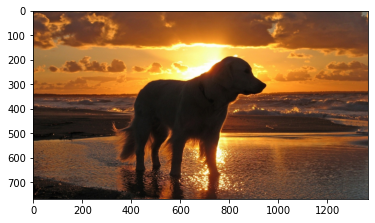

Tags da imagem: ['cachorro', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n02100877', 'Irish_setter', 0.42175627), ('n02105056', 'groenendael', 0.124544), ('n02101006', 'Gordon_setter', 0.08078752), ('n02111277', 'Newfoundland', 0.05140513), ('n02097130', 'giant_schnauzer', 0.029641239)]
Predicoes modelo INCEPTION:
 [('n02134084', 'ice_bear', 0.21635884), ('n02099601', 'golden_retriever', 0.13552476), ('n02111889', 'Samoyed', 0.04154741), ('n02104029', 'kuvasz', 0.03400778), ('n02115641', 'dingo', 0.031265635)]
Predicoes modelo RESNET:
 [('n02134084', 'ice_bear', 0.21095087), ('n02105056', 'groenendael', 0.16019624), ('n02097130', 'giant_schnauzer', 0.102368), ('n09288635', 'geyser', 0.10236195), ('n02113799', 'standard_poodle', 0.08994349)]
Predicoes modelo MOBILENET:
 [('n02115641', 'dingo', 0.18569158), ('n02134084', 'ice_bear', 0.1489367), ('n02132136', 'brown_bear', 0.11771625), ('n02111277', 'Newfoundland', 0.029183352), ('n02504458', 'African_elephant', 0.027640274)]

======

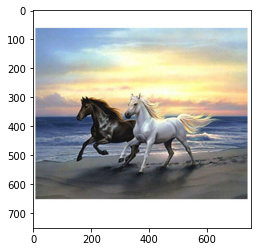

Tags da imagem: ['cavalo', 'mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n02437312', 'Arabian_camel', 0.62727046), ('n03538406', 'horse_cart', 0.14046869), ('n09428293', 'seashore', 0.05218525), ('n06359193', 'web_site', 0.030872654), ('n02091831', 'Saluki', 0.024355803)]
Predicoes modelo INCEPTION:
 [('n02389026', 'sorrel', 0.24172375), ('n03538406', 'horse_cart', 0.061085053), ('n09428293', 'seashore', 0.050232437), ('n02397096', 'warthog', 0.022560151), ('n02391049', 'zebra', 0.009645179)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.19656186), ('n03538406', 'horse_cart', 0.14471188), ('n06359193', 'web_site', 0.107386395), ('n03967562', 'plow', 0.10688871), ('n02105056', 'groenendael', 0.088492915)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.088090934), ('n03538406', 'horse_cart', 0.08402982), ('n04485082', 'tripod', 0.0349147), ('n03868242', 'oxcart', 0.02864462), ('n02403003', 'ox', 0.025566792)]

============ Index 97: praia-mar-sol-1.jpg ============

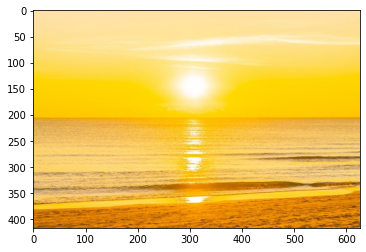

Tags da imagem: ['mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.5633092), ('n09421951', 'sandbar', 0.076907165), ('n11879895', 'rapeseed', 0.04178273), ('n02951358', 'canoe', 0.025843132), ('n03873416', 'paddle', 0.021222826)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.9130842), ('n09421951', 'sandbar', 0.057525333), ('n09332890', 'lakeside', 0.0050812596), ('n09399592', 'promontory', 0.004061367), ('n04606251', 'wreck', 0.0014841213)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.9478636), ('n09421951', 'sandbar', 0.0064892843), ('n09399592', 'promontory', 0.0026800355), ('n03873416', 'paddle', 0.0025626323), ('n02814860', 'beacon', 0.0025443623)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.89779687), ('n11879895', 'rapeseed', 0.022778504), ('n02823750', 'beer_glass', 0.013774313), ('n09332890', 'lakeside', 0.009536876), ('n09421951', 'sandbar', 0.0056998115)]

============ Index 98: predio-arvore-sol-1.jpg ============

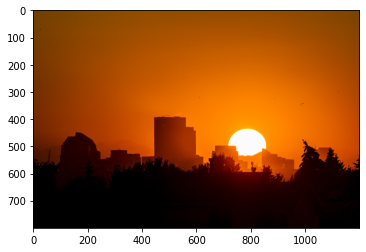

Tags da imagem: ['arvore', 'predio', 'sol']
Predicoes modelo VGG:
 [('n02782093', 'balloon', 0.45709074), ('n03837869', 'obelisk', 0.13218485), ('n03388043', 'fountain', 0.0394334), ('n04286575', 'spotlight', 0.037849527), ('n09229709', 'bubble', 0.03667547)]
Predicoes modelo INCEPTION:
 [('n04562935', 'water_tower', 0.36361355), ('n02980441', 'castle', 0.2401672), ('n02782093', 'balloon', 0.03285471), ('n03877845', 'palace', 0.0118591115), ('n02814860', 'beacon', 0.011157909)]
Predicoes modelo RESNET:
 [('n04486054', 'triumphal_arch', 0.7249257), ('n02980441', 'castle', 0.18995516), ('n02782093', 'balloon', 0.05424828), ('n03877845', 'palace', 0.0087676365), ('n02825657', 'bell_cote', 0.0037501631)]
Predicoes modelo MOBILENET:
 [('n02980441', 'castle', 0.22877647), ('n02814860', 'beacon', 0.075899094), ('n04486054', 'triumphal_arch', 0.060675573), ('n03028079', 'church', 0.055452947), ('n03877845', 'palace', 0.020866062)]

============ Index 99: predio-mar-sol-1.jpg ================


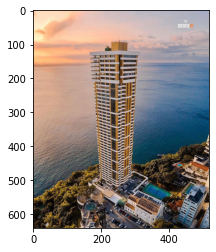

Tags da imagem: ['mar', 'predio', 'sol']
Predicoes modelo VGG:
 [('n03240683', 'drilling_platform', 0.6173967), ('n03095699', 'container_ship', 0.0871387), ('n09332890', 'lakeside', 0.05975252), ('n09428293', 'seashore', 0.055754885), ('n02894605', 'breakwater', 0.03176666)]
Predicoes modelo INCEPTION:
 [('n03240683', 'drilling_platform', 0.28638524), ('n03733805', 'measuring_cup', 0.17272417), ('n03126707', 'crane', 0.084535435), ('n03216828', 'dock', 0.038168225), ('n03065424', 'coil', 0.021196721)]
Predicoes modelo RESNET:
 [('n03240683', 'drilling_platform', 0.7826751), ('n09332890', 'lakeside', 0.11802313), ('n03126707', 'crane', 0.03398061), ('n03976657', 'pole', 0.009292493), ('n03933933', 'pier', 0.0067225266)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.18509021), ('n03240683', 'drilling_platform', 0.15289572), ('n04311004', 'steel_arch_bridge', 0.08331248), ('n09332890', 'lakeside', 0.072050594), ('n03933933', 'pier', 0.056944367)]

============ Index 100: predi

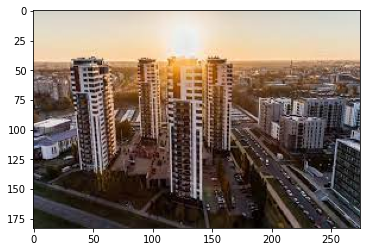

Tags da imagem: ['predio', 'sol']
Predicoes modelo VGG:
 [('n03240683', 'drilling_platform', 0.4797238), ('n03216828', 'dock', 0.14116542), ('n03095699', 'container_ship', 0.12488459), ('n03933933', 'pier', 0.088938065), ('n03126707', 'crane', 0.028777417)]
Predicoes modelo INCEPTION:
 [('n03240683', 'drilling_platform', 0.1492325), ('n09428293', 'seashore', 0.10996917), ('n03697007', 'lumbermill', 0.07595627), ('n04153751', 'screw', 0.058196604), ('n09332890', 'lakeside', 0.040496603)]
Predicoes modelo RESNET:
 [('n03697007', 'lumbermill', 0.5123186), ('n03126707', 'crane', 0.09587674), ('n03782006', 'monitor', 0.036762305), ('n03240683', 'drilling_platform', 0.033635367), ('n09332890', 'lakeside', 0.029977173)]
Predicoes modelo MOBILENET:
 [('n03240683', 'drilling_platform', 0.24135245), ('n09428293', 'seashore', 0.077142164), ('n03933933', 'pier', 0.051801), ('n03697007', 'lumbermill', 0.040329833), ('n02948072', 'candle', 0.027457139)]

============ Index 101: predio-sol-3.jpg ====

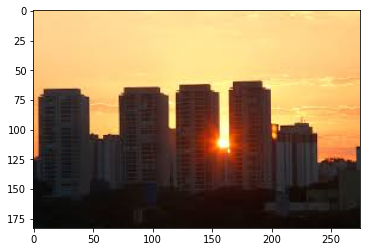

Tags da imagem: ['predio', 'sol']
Predicoes modelo VGG:
 [('n03933933', 'pier', 0.2147909), ('n03216828', 'dock', 0.107453376), ('n03344393', 'fireboat', 0.06946636), ('n03095699', 'container_ship', 0.040076952), ('n03673027', 'liner', 0.033702124)]
Predicoes modelo INCEPTION:
 [('n09332890', 'lakeside', 0.55891657), ('n09428293', 'seashore', 0.11609633), ('n02894605', 'breakwater', 0.031630524), ('n02692877', 'airship', 0.025101105), ('n03933933', 'pier', 0.023549765)]
Predicoes modelo RESNET:
 [('n09332890', 'lakeside', 0.29858056), ('n02782093', 'balloon', 0.14209795), ('n09428293', 'seashore', 0.1187377), ('n03933933', 'pier', 0.09583638), ('n02841315', 'binoculars', 0.07902254)]
Predicoes modelo MOBILENET:
 [('n03933933', 'pier', 0.19638705), ('n09332890', 'lakeside', 0.09083868), ('n03216828', 'dock', 0.08577792), ('n09428293', 'seashore', 0.06948854), ('n03240683', 'drilling_platform', 0.036019664)]

============ Index 102: predio-sol-4.jpg ================


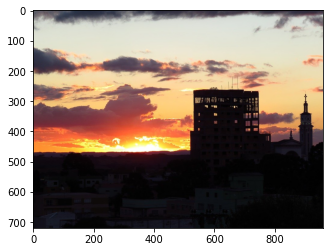

Tags da imagem: ['predio', 'sol']
Predicoes modelo VGG:
 [('n02980441', 'castle', 0.18238279), ('n04149813', 'scoreboard', 0.1028461), ('n03877845', 'palace', 0.06703981), ('n03220513', 'dome', 0.050737627), ('n03388043', 'fountain', 0.032625932)]
Predicoes modelo INCEPTION:
 [('n02980441', 'castle', 0.08606173), ('n04149813', 'scoreboard', 0.059685152), ('n03126707', 'crane', 0.055189475), ('n03788195', 'mosque', 0.042331465), ('n02825657', 'bell_cote', 0.036549784)]
Predicoes modelo RESNET:
 [('n02980441', 'castle', 0.598275), ('n03028079', 'church', 0.117908835), ('n03781244', 'monastery', 0.040585663), ('n03095699', 'container_ship', 0.030003576), ('n03126707', 'crane', 0.02776447)]
Predicoes modelo MOBILENET:
 [('n02980441', 'castle', 0.36793748), ('n03126707', 'crane', 0.052438114), ('n09428293', 'seashore', 0.025425553), ('n03028079', 'church', 0.022132406), ('n09246464', 'cliff', 0.013389053)]

============ Index 103: predio-sol-5.jpg ================


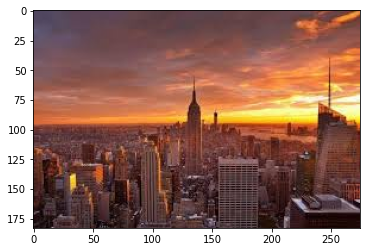

Tags da imagem: ['predio', 'sol']
Predicoes modelo VGG:
 [('n03028079', 'church', 0.16059755), ('n03355925', 'flagpole', 0.11431368), ('n03877845', 'palace', 0.089878015), ('n03781244', 'monastery', 0.059714764), ('n02980441', 'castle', 0.04372366)]
Predicoes modelo INCEPTION:
 [('n03877845', 'palace', 0.1305519), ('n03216828', 'dock', 0.11473622), ('n09332890', 'lakeside', 0.08847364), ('n03126707', 'crane', 0.06004425), ('n03355925', 'flagpole', 0.05244825)]
Predicoes modelo RESNET:
 [('n03877845', 'palace', 0.21212938), ('n03126707', 'crane', 0.17539363), ('n03447447', 'gondola', 0.107557826), ('n03028079', 'church', 0.07947345), ('n02980441', 'castle', 0.056894753)]
Predicoes modelo MOBILENET:
 [('n03877845', 'palace', 0.26422298), ('n03028079', 'church', 0.26040992), ('n02980441', 'castle', 0.1703725), ('n02825657', 'bell_cote', 0.031857304), ('n03355925', 'flagpole', 0.016924)]

============ Index 104: predio-sol-6.jpg ================


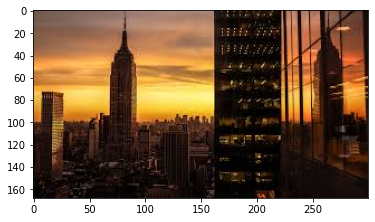

Tags da imagem: ['predio', 'sol']
Predicoes modelo VGG:
 [('n03837869', 'obelisk', 0.13878132), ('n03976657', 'pole', 0.06410855), ('n06874185', 'traffic_light', 0.049443904), ('n03216828', 'dock', 0.047993477), ('n03983396', 'pop_bottle', 0.045475684)]
Predicoes modelo INCEPTION:
 [('n03837869', 'obelisk', 0.11164177), ('n02692877', 'airship', 0.07299208), ('n09332890', 'lakeside', 0.06298897), ('n03126707', 'crane', 0.05238174), ('n03933933', 'pier', 0.04315335)]
Predicoes modelo RESNET:
 [('n03196217', 'digital_clock', 0.112998486), ('n04149813', 'scoreboard', 0.10326327), ('n03126707', 'crane', 0.098882616), ('n03388043', 'fountain', 0.07885549), ('n03877845', 'palace', 0.07726594)]
Predicoes modelo MOBILENET:
 [('n03837869', 'obelisk', 0.28961357), ('n03788195', 'mosque', 0.057055794), ('n03773504', 'missile', 0.039540224), ('n03877845', 'palace', 0.032943305), ('n03126707', 'crane', 0.03069013)]

============ Index 105: predio-sol-ave-1.jpg ================


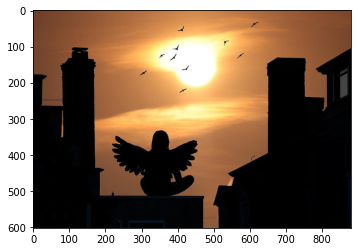

Tags da imagem: ['ave', 'predio', 'sol']
Predicoes modelo VGG:
 [('n03903868', 'pedestal', 0.33625227), ('n03837869', 'obelisk', 0.19583051), ('n02814860', 'beacon', 0.13059637), ('n03028079', 'church', 0.12017398), ('n04286575', 'spotlight', 0.029034136)]
Predicoes modelo INCEPTION:
 [('n03028079', 'church', 0.5336529), ('n02814860', 'beacon', 0.11853949), ('n02825657', 'bell_cote', 0.10180103), ('n03781244', 'monastery', 0.01581536), ('n03220513', 'dome', 0.015422743)]
Predicoes modelo RESNET:
 [('n02708093', 'analog_clock', 0.68668634), ('n03837869', 'obelisk', 0.1320417), ('n03903868', 'pedestal', 0.033198588), ('n03028079', 'church', 0.02506917), ('n03788195', 'mosque', 0.021543028)]
Predicoes modelo MOBILENET:
 [('n02814860', 'beacon', 0.5508867), ('n03781244', 'monastery', 0.101638734), ('n02980441', 'castle', 0.063588396), ('n03028079', 'church', 0.060219243), ('n03388043', 'fountain', 0.037866093)]

============ Index 106: rio-montanha-sol-arvore-1.jpg ================


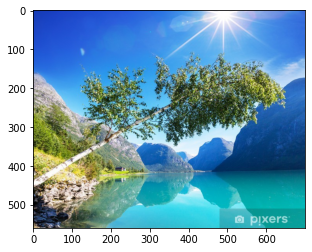

Tags da imagem: ['arvore', 'montanha', 'rio', 'sol']
Predicoes modelo VGG:
 [('n09193705', 'alp', 0.2715198), ('n09468604', 'valley', 0.16065674), ('n09332890', 'lakeside', 0.113430835), ('n03782006', 'monitor', 0.07461791), ('n03388043', 'fountain', 0.03517132)]
Predicoes modelo INCEPTION:
 [('n09468604', 'valley', 0.46300316), ('n09193705', 'alp', 0.26685965), ('n09332890', 'lakeside', 0.056059647), ('n03792972', 'mountain_tent', 0.009912977), ('n09399592', 'promontory', 0.009557818)]
Predicoes modelo RESNET:
 [('n09256479', 'coral_reef', 0.19356182), ('n09468604', 'valley', 0.11649122), ('n09193705', 'alp', 0.10509382), ('n09399592', 'promontory', 0.060449257), ('n07802026', 'hay', 0.052267946)]
Predicoes modelo MOBILENET:
 [('n09193705', 'alp', 0.4000908), ('n09468604', 'valley', 0.30772662), ('n09332890', 'lakeside', 0.11881887), ('n03388043', 'fountain', 0.053894844), ('n09472597', 'volcano', 0.019902611)]

============ Index 107: rio-sol-ponte-1.jpg ================


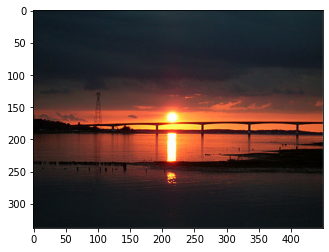

Tags da imagem: ['ponte', 'rio', 'sol']
Predicoes modelo VGG:
 [('n03933933', 'pier', 0.29899433), ('n04366367', 'suspension_bridge', 0.091416426), ('n02859443', 'boathouse', 0.07221097), ('n03160309', 'dam', 0.0686645), ('n03216828', 'dock', 0.06748838)]
Predicoes modelo INCEPTION:
 [('n03216828', 'dock', 0.33752304), ('n03933933', 'pier', 0.3038045), ('n02859443', 'boathouse', 0.16100097), ('n09332890', 'lakeside', 0.021729887), ('n02894605', 'breakwater', 0.020395193)]
Predicoes modelo RESNET:
 [('n03933933', 'pier', 0.6725342), ('n02859443', 'boathouse', 0.09256191), ('n03216828', 'dock', 0.06424767), ('n03126707', 'crane', 0.04415151), ('n09332890', 'lakeside', 0.033871837)]
Predicoes modelo MOBILENET:
 [('n03933933', 'pier', 0.7142985), ('n04366367', 'suspension_bridge', 0.0643707), ('n09399592', 'promontory', 0.04181144), ('n03216828', 'dock', 0.01197204), ('n04311004', 'steel_arch_bridge', 0.008829047)]

============ Index 108: sol-mar-1.jpg ================


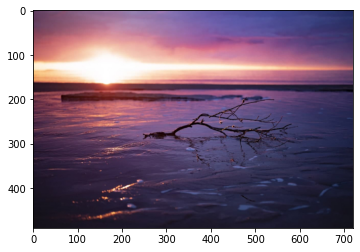

Tags da imagem: ['mar', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.3350383), ('n09332890', 'lakeside', 0.2954828), ('n02894605', 'breakwater', 0.10426891), ('n02814860', 'beacon', 0.058168426), ('n09421951', 'sandbar', 0.03471127)]
Predicoes modelo INCEPTION:
 [('n09332890', 'lakeside', 0.6320993), ('n09428293', 'seashore', 0.16671005), ('n04067472', 'reel', 0.027917493), ('n02894605', 'breakwater', 0.013719898), ('n09399592', 'promontory', 0.011280816)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.6108508), ('n09332890', 'lakeside', 0.15839316), ('n09472597', 'volcano', 0.03595254), ('n03976657', 'pole', 0.03210265), ('n09246464', 'cliff', 0.03193062)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.5382747), ('n09332890', 'lakeside', 0.22314386), ('n09399592', 'promontory', 0.14453615), ('n02859443', 'boathouse', 0.006529384), ('n09472597', 'volcano', 0.005865838)]

============ Index 109: sol-mar-2.jpg ================


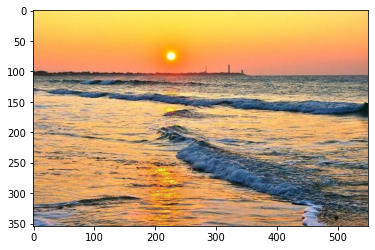

Tags da imagem: ['mar', 'sol']
Predicoes modelo VGG:
 [('n02894605', 'breakwater', 0.72957087), ('n09428293', 'seashore', 0.15061133), ('n02814860', 'beacon', 0.020077124), ('n04606251', 'wreck', 0.017586974), ('n09421951', 'sandbar', 0.01737855)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.724771), ('n09421951', 'sandbar', 0.12376321), ('n02894605', 'breakwater', 0.05121452), ('n09332890', 'lakeside', 0.017967755), ('n02814860', 'beacon', 0.01791373)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.475318), ('n02814860', 'beacon', 0.23075388), ('n02894605', 'breakwater', 0.18555003), ('n09421951', 'sandbar', 0.047973655), ('n09332890', 'lakeside', 0.020907152)]
Predicoes modelo MOBILENET:
 [('n02894605', 'breakwater', 0.8608478), ('n02814860', 'beacon', 0.059517626), ('n02100735', 'English_setter', 0.0060709566), ('n02095570', 'Lakeland_terrier', 0.005626182), ('n09428293', 'seashore', 0.0053611784)]

============ Index 110: sol-mar-3.jpg ================


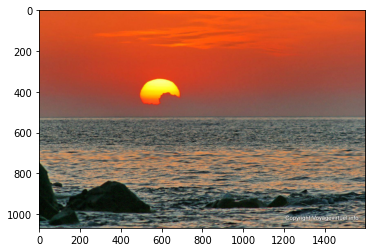

Tags da imagem: ['mar', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.64987755), ('n09332890', 'lakeside', 0.06086527), ('n09399592', 'promontory', 0.056891367), ('n02782093', 'balloon', 0.043263625), ('n02814860', 'beacon', 0.027568096)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.10961939), ('n09332890', 'lakeside', 0.101421826), ('n03888257', 'parachute', 0.04658404), ('n02782093', 'balloon', 0.03809061), ('n04507155', 'umbrella', 0.03317706)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.60349977), ('n02814860', 'beacon', 0.122844726), ('n09332890', 'lakeside', 0.0502216), ('n03888257', 'parachute', 0.0497278), ('n02051845', 'pelican', 0.016233986)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.45287806), ('n02894605', 'breakwater', 0.0945855), ('n09332890', 'lakeside', 0.07063184), ('n02782093', 'balloon', 0.06941478), ('n03942813', 'ping-pong_ball', 0.0646723)]

============ Index 111: sol-mar-ave-1.jpg ================


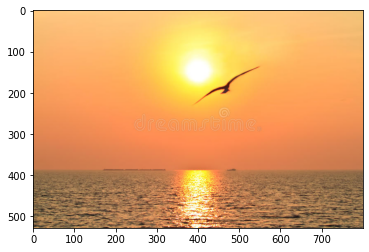

Tags da imagem: ['ave', 'mar', 'sol']
Predicoes modelo VGG:
 [('n03947888', 'pirate', 0.2679956), ('n03240683', 'drilling_platform', 0.16784368), ('n09428293', 'seashore', 0.095286675), ('n04147183', 'schooner', 0.083050065), ('n09332890', 'lakeside', 0.050380673)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.49962452), ('n02051845', 'pelican', 0.24877557), ('n02058221', 'albatross', 0.05438486), ('n03126707', 'crane', 0.028111491), ('n03240683', 'drilling_platform', 0.024395252)]
Predicoes modelo RESNET:
 [('n02051845', 'pelican', 0.6186546), ('n09428293', 'seashore', 0.3534595), ('n03240683', 'drilling_platform', 0.007200781), ('n09246464', 'cliff', 0.0052614557), ('n03126707', 'crane', 0.003326479)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.15408884), ('n09428293', 'seashore', 0.076086394), ('n02231487', 'walking_stick', 0.059474505), ('n09246464', 'cliff', 0.039014027), ('n02168699', 'long-horned_beetle', 0.03311455)]

============ Index 112: sol-mar-mo

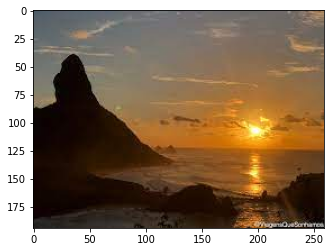

Tags da imagem: ['mar', 'montanha', 'sol']
Predicoes modelo VGG:
 [('n09399592', 'promontory', 0.461041), ('n09428293', 'seashore', 0.18847947), ('n02814860', 'beacon', 0.100142896), ('n09246464', 'cliff', 0.09586051), ('n02894605', 'breakwater', 0.021759111)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.8490695), ('n09399592', 'promontory', 0.03786201), ('n09472597', 'volcano', 0.016363667), ('n09246464', 'cliff', 0.011449202), ('n09421951', 'sandbar', 0.007849654)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.46810013), ('n03240683', 'drilling_platform', 0.10687563), ('n09399592', 'promontory', 0.09927988), ('n09246464', 'cliff', 0.068600625), ('n09288635', 'geyser', 0.051326063)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.3601594), ('n09399592', 'promontory', 0.16091403), ('n09246464', 'cliff', 0.082052805), ('n09332890', 'lakeside', 0.021835003), ('n09472597', 'volcano', 0.019468788)]

============ Index 113: sol-mar-ponte-1.jpg ===============

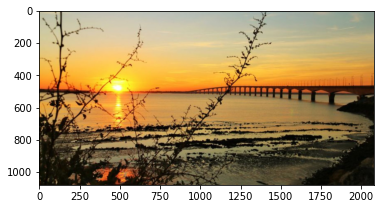

Tags da imagem: ['mar', 'ponte', 'sol']
Predicoes modelo VGG:
 [('n09428293', 'seashore', 0.3574864), ('n09332890', 'lakeside', 0.15744717), ('n03733281', 'maze', 0.05264619), ('n03877845', 'palace', 0.043866802), ('n03933933', 'pier', 0.03907593)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.6093227), ('n03933933', 'pier', 0.07552254), ('n09332890', 'lakeside', 0.038796082), ('n02894605', 'breakwater', 0.030102523), ('n09421951', 'sandbar', 0.026949473)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.73983455), ('n09332890', 'lakeside', 0.17771529), ('n03126707', 'crane', 0.037001923), ('n03388043', 'fountain', 0.008323246), ('n03933933', 'pier', 0.007561854)]
Predicoes modelo MOBILENET:
 [('n09332890', 'lakeside', 0.38765723), ('n09428293', 'seashore', 0.10765566), ('n03933933', 'pier', 0.06943894), ('n11879895', 'rapeseed', 0.053364232), ('n03216828', 'dock', 0.014554202)]

============ Index 114: sol-mar-praia-4.jpg ================


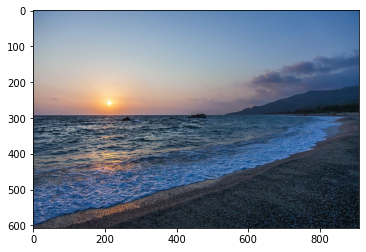

Tags da imagem: ['mar', 'praia', 'sol']
Predicoes modelo VGG:
 [('n09332890', 'lakeside', 0.41068473), ('n09428293', 'seashore', 0.18949446), ('n02894605', 'breakwater', 0.1803818), ('n09399592', 'promontory', 0.121076055), ('n09421951', 'sandbar', 0.041934207)]
Predicoes modelo INCEPTION:
 [('n09428293', 'seashore', 0.63905966), ('n09399592', 'promontory', 0.132196), ('n09332890', 'lakeside', 0.102761984), ('n09421951', 'sandbar', 0.09211217), ('n02894605', 'breakwater', 0.0023291125)]
Predicoes modelo RESNET:
 [('n09428293', 'seashore', 0.36806613), ('n09332890', 'lakeside', 0.24827719), ('n09421951', 'sandbar', 0.17345802), ('n02894605', 'breakwater', 0.13392337), ('n09399592', 'promontory', 0.038159747)]
Predicoes modelo MOBILENET:
 [('n09428293', 'seashore', 0.3514757), ('n09399592', 'promontory', 0.17969625), ('n02894605', 'breakwater', 0.13588622), ('n09421951', 'sandbar', 0.11773152), ('n09332890', 'lakeside', 0.08813635)]


In [16]:
# Funcao de decodificaca do jogo de saida (target) en lista dos tags da foto
def oneHotDecode(tgt, dicIdTag):
    '''Retorna uma lista dos tags de ID correspondendo as posicoes do jogo de saida com 1'''
    #Recupera as posicoes preenchidas
    posId = np.nonzero(tgt)
    #Monta a lista dos tags da imagem
    lstTag = [dicIdTag[id] for id in posId[0]]
    #OBS: Precisa recuperar o indice 0 de posId prque np.nonzero retorna tuple de array de posicao nao 0, um elemento por dimensao do array
    return lstTag

#Loop sobre as predicoes por foto, comparando contra os tags reais dela
for idx in range(len(Y)):
    nameFile = npNameFiles[idx] 
    print(f'\n============ Index {idx}: {nameFile} ================')
    #Visualizacao da imagem sem transformacao
    img = load_img(fr'{nameFile}')
    plt.imshow(img)
    plt.show()
    #Consulta do decode da target (volta para uma lista de tags)
    lstTag = oneHotDecode(Y[idx], dicIdTag)
    print(f'Tags da imagem: {lstTag}')
    #Consulta das predicoes por modelo
    tagPredVgg =  dicTagPred['VGG'][idx]
    print(f'Predicoes modelo VGG:\n {tagPredVgg}')
    tagPredInception =  dicTagPred['INCEPTION'][idx]
    print(f'Predicoes modelo INCEPTION:\n {tagPredInception}')
    tagPredResnet =  dicTagPred['RESNET'][idx]
    print(f'Predicoes modelo RESNET:\n {tagPredResnet}')
    tagPredMobilenet =  dicTagPred['MOBILENET'][idx]
    print(f'Predicoes modelo MOBILENET:\n {tagPredMobilenet}')
    
    plt.pause(1) 
    


In [147]:
len(X299)
tgt = Y[0]
[id for id in tgt.nonzero()]
dicTagPred['VGG'][0]


[('n09472597', 'volcano', 0.822717),
 ('n09468604', 'valley', 0.08153004),
 ('n09193705', 'alp', 0.05581967),
 ('n02793495', 'barn', 0.009579776),
 ('n09332890', 'lakeside', 0.0046399846)]

In [141]:

type(test)
[dicIdTag[id] for id in test[0]]

['montanha', 'sol']

In [28]:
X224.shape
type(X224)
X224


array([[[[228., 241., 255.],
         [228., 241., 255.],
         [228., 241., 255.],
         ...,
         [229., 242., 251.],
         [220., 234., 247.],
         [220., 234., 247.]],

        [[226., 239., 255.],
         [226., 239., 255.],
         [226., 239., 255.],
         ...,
         [222., 236., 245.],
         [220., 234., 247.],
         [220., 233., 249.]],

        [[223., 237., 250.],
         [223., 237., 250.],
         [223., 237., 250.],
         ...,
         [211., 228., 238.],
         [216., 232., 247.],
         [216., 232., 248.]],

        ...,

        [[120., 121., 126.],
         [127., 128., 133.],
         [129., 130., 135.],
         ...,
         [ 85.,  86.,  91.],
         [ 99., 100., 105.],
         [ 91.,  92.,  97.]],

        [[137., 138., 143.],
         [120., 121., 126.],
         [136., 137., 142.],
         ...,
         [ 92.,  93.,  98.],
         [104., 105., 110.],
         [105., 106., 111.]],

        [[140., 141., 146.],
       

In [224]:
YPred.shape
YPred[0]
tagPred[0]
#tagPred.shape


# retrieve the FIRST most likely result, e.g. highest probability
#label1 = label[0][0]
# print the classification
#print('-> Primeira classe predita: %s (%.2f%%)' % (label1[1], label1[2]*100))
# retrieve the SECOND most likely result, e.g. highest probability
#label2 = label[0][1]
# print the classification
#print('-> Segunda classe predita: %s (%.2f%%)' % (label2[1], label2[2]*100))
# retrieve the THIRD most likely result, e.g. highest probability
#label3 = label[0][3]
# print the classification
#print('-> Terceira classe predita: %s (%.2f%%)' % (label3[1], label3[2]*100))

[('n02980441', 'castle', 0.53980035),
 ('n03876231', 'paintbrush', 0.14076969),
 ('n03388043', 'fountain', 0.0734014),
 ('n03028079', 'church', 0.046915106),
 ('n02782093', 'balloon', 0.031909067)]

In [60]:
gntImages = glob.iglob("C:\\Users\\Utilisateur\\Downloads\\tmp\\**\\IMG_8339*.jpg", recursive=True)
type(gntImages)
for pth in gntImages:
    print(pth)
    # leitura da imagem usando PIL
    img = Image.open(pth)
    print(type(img))
    # Extracao dos EXIF data (metadata) da imagem
    exifImg = img.getexif()
    
    # Extracao dos diferentes tags da imagem
    for tagId in exifImg:
        print(f'Tag {tagId} {TAGS.get(tagId)}: {exifImg.get(tagId)} ')

C:\Users\Utilisateur\Downloads\tmp\MBA\CACHORRO\IMG_8339.JPG
<class 'PIL.JpegImagePlugin.JpegImageFile'>
Tag 34853 GPSInfo: 1982 
Tag 296 ResolutionUnit: 2 
Tag 34665 ExifOffset: 206 
Tag 271 Make: Apple 
Tag 272 Model: iPhone 8 
Tag 305 Software: 13.1.3 
Tag 274 Orientation: 1 
Tag 306 DateTime: 2019:12:22 14:05:20 
Tag 531 YCbCrPositioning: 1 
Tag 282 XResolution: 72.0 
Tag 283 YResolution: 72.0 


In [61]:
gntImages = glob.iglob("C:\\Users\\Utilisateur\\Downloads\\tmp\\**\\IMG_8339*.jpg", recursive=True)
type(gntImages)
for pth in gntImages:
    print(pth)
    # leitura da imagem usando PIL
    img = exif.Image(pth)
    print(type(img))
    
    for tag in img.list_all():
        print(f'{tag}: {img.get(tag)}')
        
    PredicaoResnet(pth)
    


C:\Users\Utilisateur\Downloads\tmp\MBA\CACHORRO\IMG_8339.JPG
<class 'exif._image.Image'>
make: Apple
model: iPhone 8
orientation: 1
x_resolution: 72.0
y_resolution: 72.0
resolution_unit: 2
software: 13.1.3
datetime: 2019:12:22 14:05:20
y_and_c_positioning: 1
_exif_ifd_pointer: 206
_gps_ifd_pointer: 1982
compression: 6
jpeg_interchange_format: 2326
jpeg_interchange_format_length: 5648
exposure_time: 0.03333333333333333
f_number: 1.8
exposure_program: 2
photographic_sensitivity: 32
exif_version: 0231
datetime_original: 2019:12:22 14:05:20
datetime_digitized: 2019:12:22 14:05:20
offset_time: -03:00
offset_time_original: -03:00
offset_time_digitized: -03:00
components_configuration: None
shutter_speed_value: 4.907684296659972
aperture_value: 1.6959938128383605
brightness_value: 3.797009598818607
exposure_bias_value: 0.0
metering_mode: 5
flash: Flash(flash_fired=False, flash_return=<FlashReturn.NO_STROBE_RETURN_DETECTION_FUNCTION: 0>, flash_mode=<FlashMode.COMPULSORY_FLASH_SUPPRESSION: 2>, 

In [69]:
print("Using glob.glob()")
files = glob.glob("C:\\Users\\Utilisateur\\Downloads\\tmp\\**\\ara*.jpg", 
                   recursive = True)
for file in files:
    print(type(file))
    print(file)

Using glob.glob()
<class 'str'>
C:\Users\Utilisateur\Downloads\tmp\MBA\aranha-1.jpg
